# Title: Building Accurate Models for Unit Sales Prediction in Favorita Stores using Time Series Forecasting

## Project Description

A time series is a sequence of data points that are indexed and ordered chronologically over time. Time series data can be observed at regular or irregular intervals and can be collected over any time period, ranging from seconds to decades or even centuries. Time series data can be univariate (i.e., a single variable is recorded over time) or multivariate (i.e., multiple variables are recorded over time).Favorita Corporation is an Ecuadorian company that creates and invests in the commercial, industrial and real estate areas. Its subsidiaries have activities in six countries in the region, including Panama, Paraguay, Peru, Colombia, Costa Rica and Chile. They offer the best products, services and experiences in an efficient, sustainable and responsible way to improve the quality of life. 

The aim of this project is to forecast the unit sales of the products across different stores. This is to optimize their inventory management , marketing strategies  and pricing  decisions. To achieve this results, we employed the use of time series in collaboration with different machine learning algorithms via the CRISP-DM framework. 

The objective of this analysis is to select the best prediction model from the different ML algorithms tested. This model will be the solution to be adopted by the company to help Favorita Corporation make insightful decisions in relation to their retail sales ,promotion and customer statisfaction. 

## Hypothesis 

- Null Hypothesis:
Promotional activities have a significant impact on the store sales at Corporation Favorita.

- Alternate Hypothesis:
Promotional activities does not have a significant impact on the store sales at Corporation Favorita.


## Questions 

1.which city had the highest stores

2.which month did we have the highest sale

3.which store had the highest transaction?

4.which store had the highest sale?

5.what is the most bought product?



## Libraries Installation

In [1]:
##for autoarima 

##!pip install pmdarima

##For Facebook Prophet
##!pip install fbprophet
##!pip install category_encoders

## Libraries Importation

In [2]:
##data handling

import pandas as pd
import numpy as np

pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 100)

##data visualizations
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as ex
import plotly.offline as po

##Algorithms 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from prophet import Prophet
from sklearn.model_selection import train_test_split

##Error evaluations
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_log_error as MSLE
from sklearn.metrics import mean_squared_error as MSE
from statsmodels.tools.eval_measures import rmse

##stat models 
from statsmodels.tsa.stattools import adfuller as adf ##for adf test
import statsmodels.api as sma ### for seasonal decomposition 
from statsmodels.graphics.tsaplots import plot_acf as ACF
from statsmodels.graphics.tsaplots import plot_pacf as PACF
from statsmodels.tsa.stattools import grangercausalitytests ##grenger causality test
 
# Other packages
import os
import warnings 
warnings.filterwarnings("ignore")
from datetime import datetime
import logging
logging.getLogger('prophet').setLevel(logging.WARNING)

Below is the section to import all the packages/libraries that will be used through this notebook.

## Data loading


In [3]:
##Creating a function to parse our date

def convert_to_date(w):
    return datetime.strptime(w,"%Y-%m-%d")

#Declaring data file path variables
train_path = "Desktop/Pandas/Azubi/LP2/train.csv"
test_path = "Desktop/Pandas/Azubi/LP2/test.csv"

store_path = "Desktop/Pandas/Azubi/LP2/stores.csv"
holidays_path = "Desktop/Pandas/Azubi/LP2/holidays_events.csv"
transactions_path = "Desktop/Pandas/Azubi/LP2/transactions.csv"
oil_path = "Desktop/Pandas/Azubi/LP2/oil.csv"


#Reading the data with pandas
df_train = pd.read_csv(train_path, parse_dates= ["date"], date_parser= convert_to_date)
df_test = pd.read_csv(test_path, parse_dates= ["date"], date_parser= convert_to_date)

store = pd.read_csv(store_path)
holidays = pd.read_csv(holidays_path, parse_dates= ["date"], date_parser= convert_to_date)
transactions = pd.read_csv(transactions_path, parse_dates= ["date"], date_parser= convert_to_date)
oil = pd.read_csv(oil_path, parse_dates= ["date"], date_parser= convert_to_date)

In [4]:
## we will just take a look at each dataset

df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [5]:
df_test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [6]:
store

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [7]:
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [8]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [9]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


## Exploratory Data Analysis

Approach:
    
 - We will explore each dataset individually
 - We will answer each questions for our bivariate analysis
 - We won't visualize the test data into details since its similar to our train data
 - Most attention will be focused on the train dataset since that's the most crucial dataset for our predictions

### Datasets Overview

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


In [11]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           28512 non-null  int64         
 1   date         28512 non-null  datetime64[ns]
 2   store_nbr    28512 non-null  int64         
 3   family       28512 non-null  object        
 4   onpromotion  28512 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 1.1+ MB


In [12]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.9 MB


In [13]:
holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [14]:
oil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   date        1218 non-null   datetime64[ns]
 1   dcoilwtico  1175 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 19.2 KB


In [15]:
store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


#### Notes from the .info()

- Every attribute of each dataset has the right datatype
- There were missing values in the oil dataset

### Exploring the store dataset

In [16]:
store.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


We will explore each column to see if we can find some valuable information

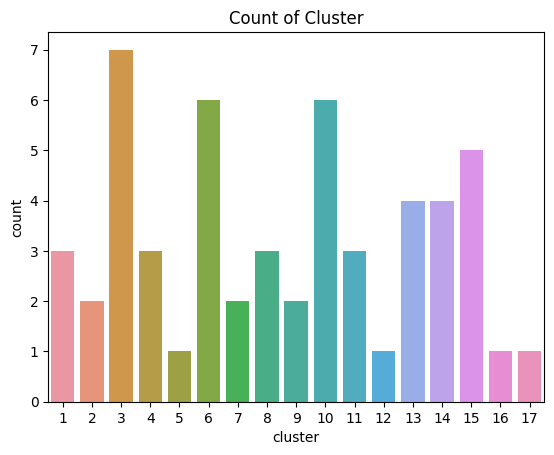

In [17]:
sns.countplot("cluster", data=store)

plt.title("Count of Cluster")

plt.show()


##There are 17 unique clusters with cluster 3 having the highest count

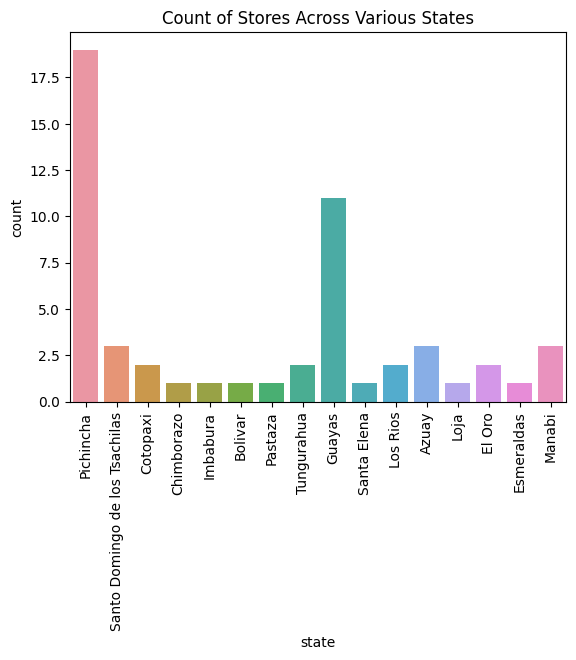

<Figure size 2000x1500 with 0 Axes>

In [18]:
sns.countplot("state", data=store)

plt.title("Count of Stores Across Various States")
plt.xticks(rotation=90)
plt.figure(figsize= (20,15))

plt.show()
##There are 16 unique states with Pichincha having the highest number of stores

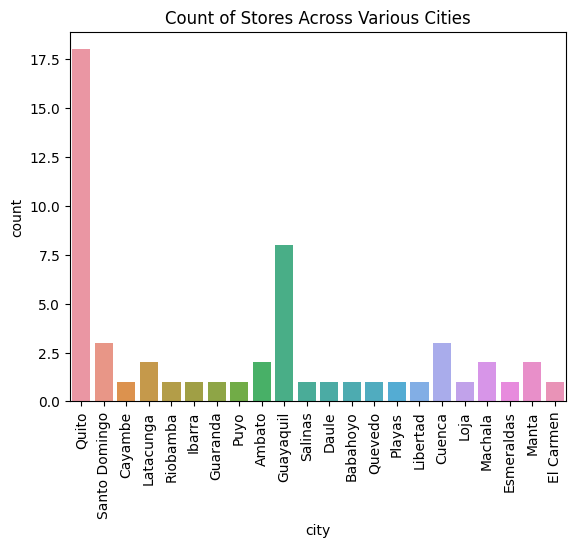

<Figure size 2000x1500 with 0 Axes>

In [19]:
sns.countplot("city", data=store)

plt.title("Count of Stores Across Various Cities")
plt.xticks(rotation=90)
plt.figure(figsize= (20,15))

plt.show()

##store.city.value_counts()
##There are 22 unique cities with Quito having the highest count

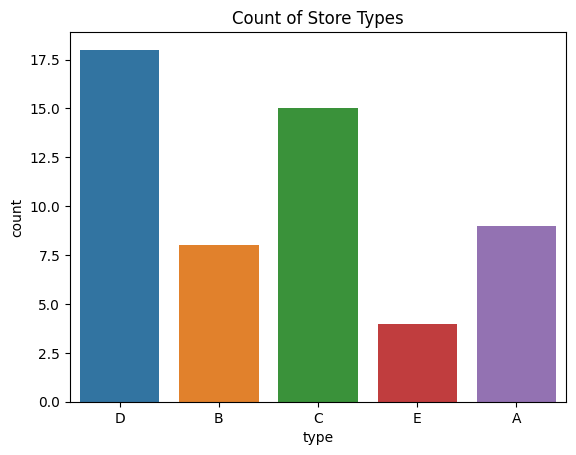

In [20]:
sns.countplot("type", data=store)

plt.title("Count of Store Types")

plt.show()

##5 unique store typeswith store D having the highest count

In [21]:
print("There are:", len(store.store_nbr.unique()), "Unique Stores")
##There are 54 unique stores

There are: 54 Unique Stores


In [22]:
store.describe()

,store_nbr,cluster
count,54.000000,54.000000
mean,27.500000,8.481481
std,15.732133,4.693395
min,1.000000,1.000000
25%,14.250000,4.000000
50%,27.500000,8.500000
75%,40.750000,13.000000
max,54.000000,17.000000


In Summary:

    - There are 17 unique clusters with cluster 3 having the highest count
    - There are 16 unique states
    - There are 22 unique cities with Quito having the highest count
    - There are 54 unique stores Across 16 states and 22 cities
    - There are 5 unique store types with stores type D having the highest count

### Exploring the Transaction Dataset

In [23]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [24]:
##making a copy just in case we make any mistake 

## Also, we will be using the copy for our exploration


trans= transactions.copy()

In [25]:
##Setting the data as our index for better analysis 

trans= trans.set_index("date")

In [26]:
trans

,store_nbr,transactions
date,,
2013-01-01,25,770
2013-01-02,1,2111
2013-01-02,2,2358
2013-01-02,3,3487
2013-01-02,4,1922
...,...,...
2017-08-15,50,2804
2017-08-15,51,1573
2017-08-15,52,2255


In [27]:
##plotting our transaction time series to see its behaviour

fig= ex.line(x= trans.index, y= "transactions", data_frame= trans)

fig.update_xaxes(rangeslider_visible= True)

fig.show()

In [28]:
##We can see an increase in transactions on the 23rd of december of each year.
##Also there are some increase in transactions around May of each year

<Axes: >

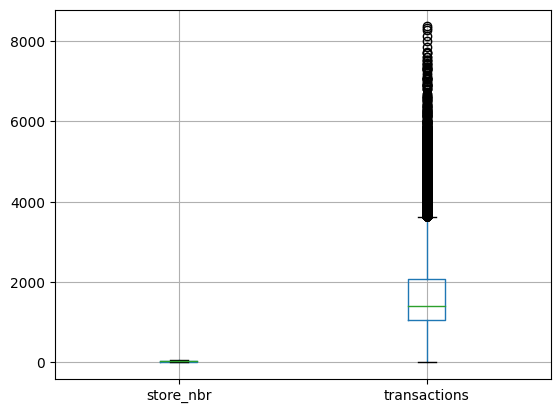

In [29]:
##Let's check for outliers

transactions.boxplot()

Text(0.5, 1.0, 'Top 5 Store with the Highest Transactions')

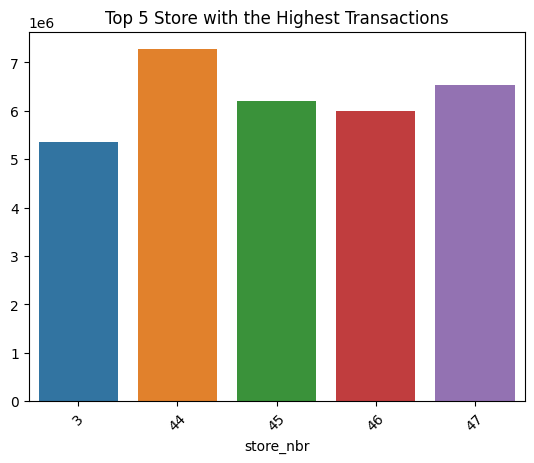

In [30]:
##let's see which stores had the highest transactions

sto_tran= trans.groupby("store_nbr")["transactions"].agg("sum").sort_values(ascending= False).head()

sns.barplot(x=sto_tran.index, y=sto_tran.values)

plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Transactions')

Summary of Transaction Dataset:
    
    - The store dataset had some seasonality with a spike in sales on every 23rd of December
    - store number 44 had the highest number of transactions
    - There are some outliers in the transactions
    - No inherent difference in transactions after earthquake

### Exploring the Holidays Dataset

In [31]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


In [32]:
##making a copy again to ensure we do not mistakenly lose data
holi= holidays.copy()

In [33]:
##Let's use a bubble plot to visualize the most prominent 

##We are trying to group the holidays based on count. And we are creating a column known as count. 

type_counts = holi.groupby('type').size().reset_index(name="count")



type_counts


,type,count
0,Additional,51
1,Bridge,5
2,Event,56
3,Holiday,221
4,Transfer,12
5,Work Day,5


In [34]:
##Now let's plot the dataframe above

fig = ex.scatter(type_counts, x='type', y='count', size='count', color= "type", hover_name='type',
                 log_y=False, size_max=60)


fig.show()

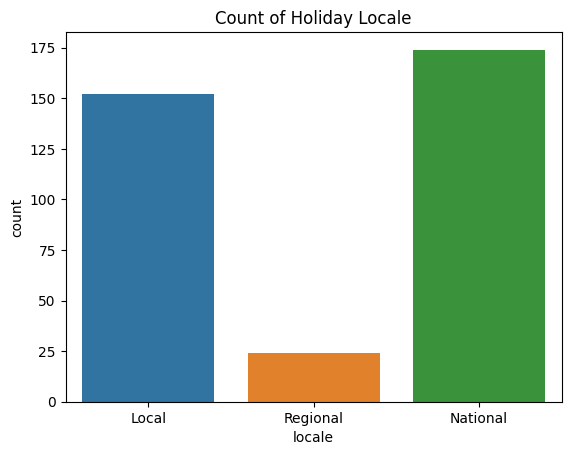

In [35]:
##Let's see which locale has the highest number of holidays

plt.title("Count of Holiday Locale")
sns.countplot("locale", data= holi)
plt.show()

In [36]:
##Let's also see how many holidays were transferred and not transfeered 

trans_count= holi.groupby("transferred").size().reset_index(name="count")

trans_count

,transferred,count
0,False,338
1,True,12


([<matplotlib.patches.Wedge at 0x1549f6227c0>,
 [Text(-1.0936251618386073, 0.11825398679740307, 'False'),
  Text(1.0936251576867049, -0.11825402519461974, 'True')])

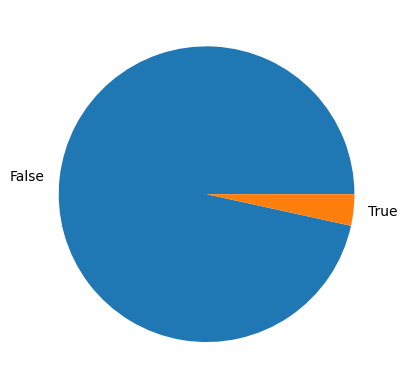

In [37]:
##visualizing the plot above 

sns.set_color_codes("pastel")

plt.pie(data= trans_count,x= "count", labels= "transferred" )

#### Summary of the Holiday Column:

- Most holidays were national holidays
- Most holidays were observed the same day they occured
- Most of the holidays were not transferred except 12 holidays

### Exploring the Oil Dataset

In [38]:
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [39]:
oil_1= oil.copy()

In [40]:
oil= oil.set_index("date")

In [41]:
oil

,dcoilwtico
date,
2013-01-01,NaN
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20
...,...
2017-08-25,47.65
2017-08-28,46.40
2017-08-29,46.46


In [42]:
##We know this dataset has missing values, and since the first value is missing, I will use the backfill method 

oil["dcoilwtico"]= oil["dcoilwtico"].fillna(method= "bfill")

oil

,dcoilwtico
date,
2013-01-01,93.14
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20
...,...
2017-08-25,47.65
2017-08-28,46.40
2017-08-29,46.46


<Axes: xlabel='date'>

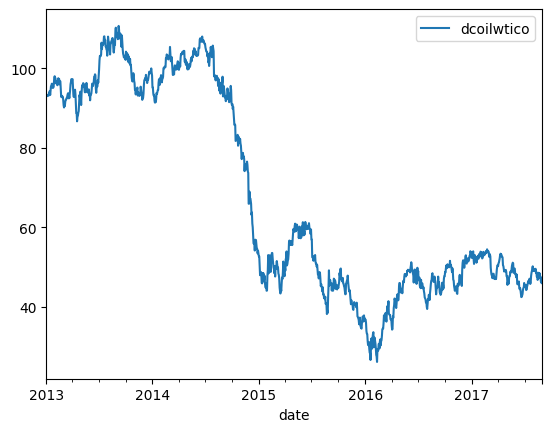

In [43]:
oil.plot()

#### Summary of the oil  dataset:

- There was a price drop from 2014 to 2017, we will see if it affected sales

### Exploring the train dataset

In [44]:
## Creating a copy to ensure we can retrive the orginal dataframe incase of an error during our analysis

train_copy= df_train.copy()

In [45]:
train_copy=train_copy.set_index("date")

In [46]:
train_copy

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.000,0
2013-01-01,1,1,BABY CARE,0.000,0
2013-01-01,2,1,BEAUTY,0.000,0
2013-01-01,3,1,BEVERAGES,0.000,0
2013-01-01,4,1,BOOKS,0.000,0
...,...,...,...,...,...
2017-08-15,3000883,9,POULTRY,438.133,0
2017-08-15,3000884,9,PREPARED FOODS,154.553,1
2017-08-15,3000885,9,PRODUCE,2419.729,148


#### Univariate Analysis 

array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'store_nbr'}>],
       [<Axes: title={'center': 'sales'}>,
        <Axes: title={'center': 'onpromotion'}>]], dtype=object)

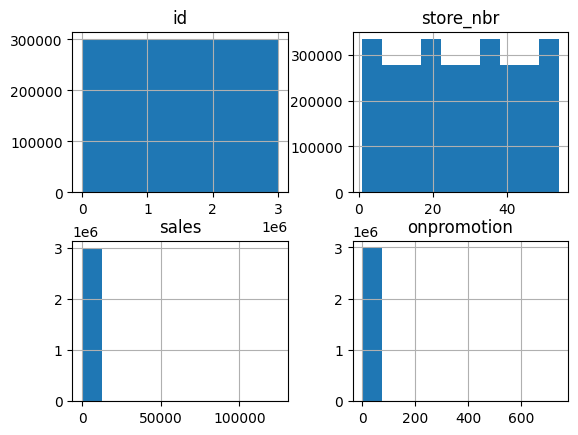

In [47]:
##Checking the distribution of the train dataset

train_copy.hist()

<Axes: >

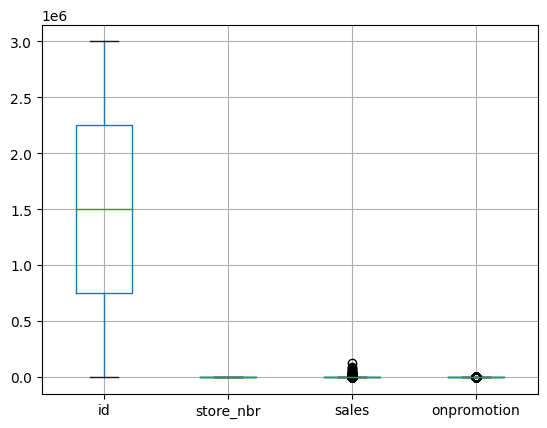

In [48]:
##Checking for outliers

train_copy.boxplot()

In [49]:
##Exploring the family attrubute

family_counts = train_copy.groupby('family').size().reset_index(name='count')


fig_1 = ex.scatter(family_counts, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_1.show()

All the family had the same count, and this makes sense because on days there were no purchases, the family of the product was still included in the dataset

In [50]:
#### Let's see which family was frequently bought  

family_bought= train_copy[train_copy["sales"]!=0 ]

##Lets group and plot

family_sale = family_bought.groupby('family').size().reset_index(name='count').sort_values(by= "count")


fig_2= ex.scatter(family_sale, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_2.show()

#### Notes on the Family Attibute

- books where bought less often, bread and bakery had the highest sales

<Axes: xlabel='date'>

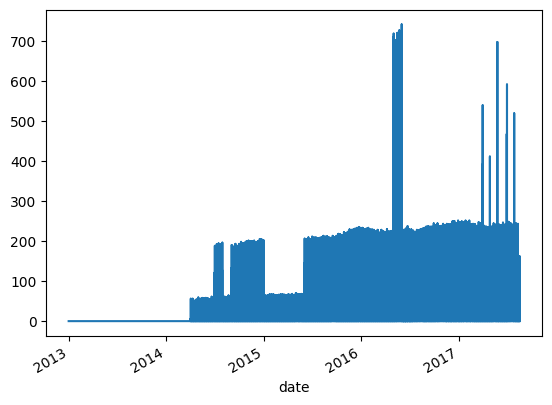

In [51]:
###Exploring the on_promotion atttribute

train_copy["onpromotion"].plot()

- No promotions were made from 2013 to 2014
- There were increased promotions in 2016;likewise, 2017, and we will investigate that
- There was a drop in promotion withint some months in 2015 and 2014

date
2013-01-31    Axes(0.125,0.2;0.775x0.68)
2013-02-28    Axes(0.125,0.2;0.775x0.68)
2013-03-31    Axes(0.125,0.2;0.775x0.68)
2013-04-30    Axes(0.125,0.2;0.775x0.68)
2013-05-31    Axes(0.125,0.2;0.775x0.68)
2013-06-30    Axes(0.125,0.2;0.775x0.68)
2013-07-31    Axes(0.125,0.2;0.775x0.68)
2013-08-31    Axes(0.125,0.2;0.775x0.68)
2013-09-30    Axes(0.125,0.2;0.775x0.68)
2013-10-31    Axes(0.125,0.2;0.775x0.68)
2013-11-30    Axes(0.125,0.2;0.775x0.68)
2013-12-31    Axes(0.125,0.2;0.775x0.68)
2014-01-31    Axes(0.125,0.2;0.775x0.68)
2014-02-28    Axes(0.125,0.2;0.775x0.68)
2014-03-31    Axes(0.125,0.2;0.775x0.68)
2014-04-30    Axes(0.125,0.2;0.775x0.68)
2014-05-31    Axes(0.125,0.2;0.775x0.68)
2014-06-30    Axes(0.125,0.2;0.775x0.68)
2014-07-31    Axes(0.125,0.2;0.775x0.68)
2014-08-31    Axes(0.125,0.2;0.775x0.68)
2014-09-30    Axes(0.125,0.2;0.775x0.68)
2014-10-31    Axes(0.125,0.2;0.775x0.68)
2014-11-30    Axes(0.125,0.2;0.775x0.68)
2014-12-31    Axes(0.125,0.2;0.775x0.68)
2015-01-31 

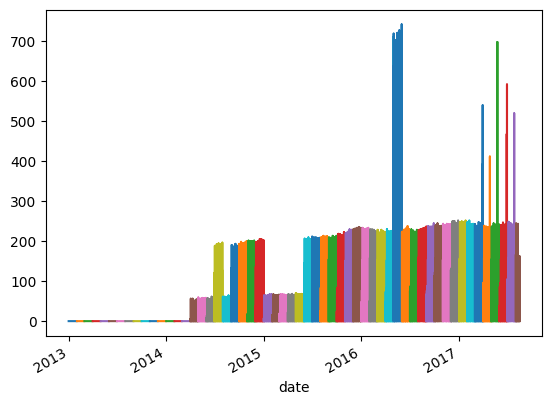

In [52]:
##Let's see what happened each month
month_promo=train_copy["onpromotion"].resample("M")

month_promo.plot()

Notes of promotion after resmapling on promotion by month:
    
    - Promotions were toned down from January to May of 2015
    
    - They increased thier promotions for May of 2016, and we are guessing this is because of the earthquake
    
    - Also, we can see an increase in promotions for some days in march to july of 2017

date
2016-01-31    Axes(0.125,0.2;0.775x0.68)
2016-02-29    Axes(0.125,0.2;0.775x0.68)
2016-03-31    Axes(0.125,0.2;0.775x0.68)
2016-04-30    Axes(0.125,0.2;0.775x0.68)
2016-05-31    Axes(0.125,0.2;0.775x0.68)
2016-06-30    Axes(0.125,0.2;0.775x0.68)
2016-07-31    Axes(0.125,0.2;0.775x0.68)
2016-08-31    Axes(0.125,0.2;0.775x0.68)
2016-09-30    Axes(0.125,0.2;0.775x0.68)
2016-10-31    Axes(0.125,0.2;0.775x0.68)
2016-11-30    Axes(0.125,0.2;0.775x0.68)
2016-12-31    Axes(0.125,0.2;0.775x0.68)
Freq: M, Name: onpromotion, dtype: object

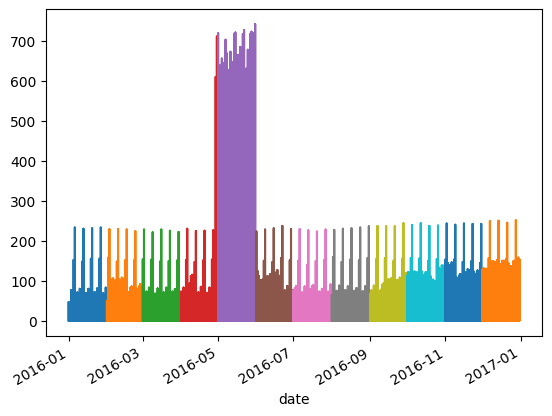

In [53]:
##Due to earthquake, might be interesting to see how promotions were affected in 2016
Month_2016=train_copy["onpromotion"].loc["2016"].resample("M")

Month_2016.plot()

- From the graph, onpromotions in 2016 were pretty steady in April
- They increased promotion during the end of April and in May of 2016

date
2016-04-01    Axes(0.125,0.2;0.775x0.68)
2016-04-02    Axes(0.125,0.2;0.775x0.68)
2016-04-03    Axes(0.125,0.2;0.775x0.68)
2016-04-04    Axes(0.125,0.2;0.775x0.68)
2016-04-05    Axes(0.125,0.2;0.775x0.68)
2016-04-06    Axes(0.125,0.2;0.775x0.68)
2016-04-07    Axes(0.125,0.2;0.775x0.68)
2016-04-08    Axes(0.125,0.2;0.775x0.68)
2016-04-09    Axes(0.125,0.2;0.775x0.68)
2016-04-10    Axes(0.125,0.2;0.775x0.68)
2016-04-11    Axes(0.125,0.2;0.775x0.68)
2016-04-12    Axes(0.125,0.2;0.775x0.68)
2016-04-13    Axes(0.125,0.2;0.775x0.68)
2016-04-14    Axes(0.125,0.2;0.775x0.68)
2016-04-15    Axes(0.125,0.2;0.775x0.68)
2016-04-16    Axes(0.125,0.2;0.775x0.68)
2016-04-17    Axes(0.125,0.2;0.775x0.68)
2016-04-18    Axes(0.125,0.2;0.775x0.68)
2016-04-19    Axes(0.125,0.2;0.775x0.68)
2016-04-20    Axes(0.125,0.2;0.775x0.68)
2016-04-21    Axes(0.125,0.2;0.775x0.68)
2016-04-22    Axes(0.125,0.2;0.775x0.68)
2016-04-23    Axes(0.125,0.2;0.775x0.68)
2016-04-24    Axes(0.125,0.2;0.775x0.68)
2016-04-25 

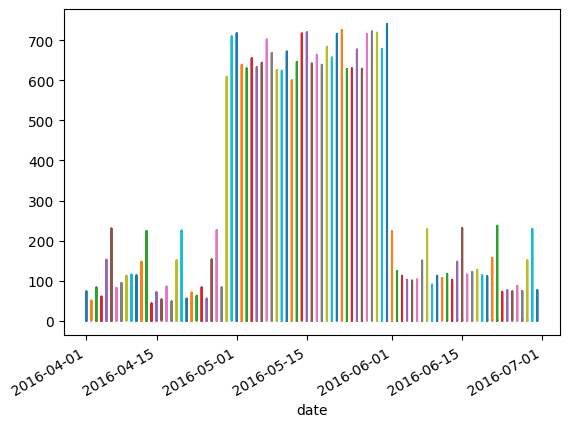

In [54]:
##Let's resample the above data by day to see which days  happened:

train_day=train_copy["onpromotion"].loc["2016-04":"2016-06"].resample("D")

train_day.plot()

- Massive promotion was ran from 29th April to 31st May of 2016


<Axes: xlabel='date'>

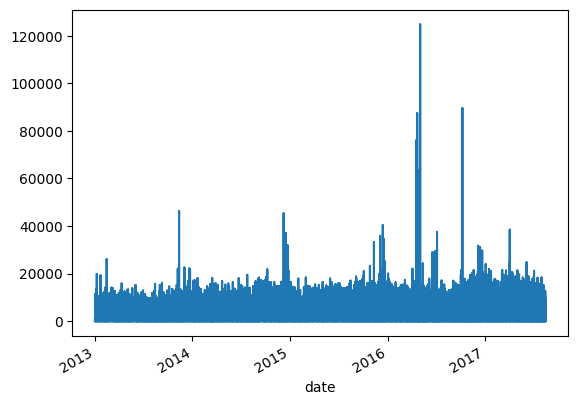

In [55]:
train_copy.sales.plot()

date
2013-01-31    Axes(0.125,0.2;0.775x0.68)
2013-02-28    Axes(0.125,0.2;0.775x0.68)
2013-03-31    Axes(0.125,0.2;0.775x0.68)
2013-04-30    Axes(0.125,0.2;0.775x0.68)
2013-05-31    Axes(0.125,0.2;0.775x0.68)
2013-06-30    Axes(0.125,0.2;0.775x0.68)
2013-07-31    Axes(0.125,0.2;0.775x0.68)
2013-08-31    Axes(0.125,0.2;0.775x0.68)
2013-09-30    Axes(0.125,0.2;0.775x0.68)
2013-10-31    Axes(0.125,0.2;0.775x0.68)
2013-11-30    Axes(0.125,0.2;0.775x0.68)
2013-12-31    Axes(0.125,0.2;0.775x0.68)
2014-01-31    Axes(0.125,0.2;0.775x0.68)
2014-02-28    Axes(0.125,0.2;0.775x0.68)
2014-03-31    Axes(0.125,0.2;0.775x0.68)
2014-04-30    Axes(0.125,0.2;0.775x0.68)
2014-05-31    Axes(0.125,0.2;0.775x0.68)
2014-06-30    Axes(0.125,0.2;0.775x0.68)
2014-07-31    Axes(0.125,0.2;0.775x0.68)
2014-08-31    Axes(0.125,0.2;0.775x0.68)
2014-09-30    Axes(0.125,0.2;0.775x0.68)
2014-10-31    Axes(0.125,0.2;0.775x0.68)
2014-11-30    Axes(0.125,0.2;0.775x0.68)
2014-12-31    Axes(0.125,0.2;0.775x0.68)
2015-01-31 

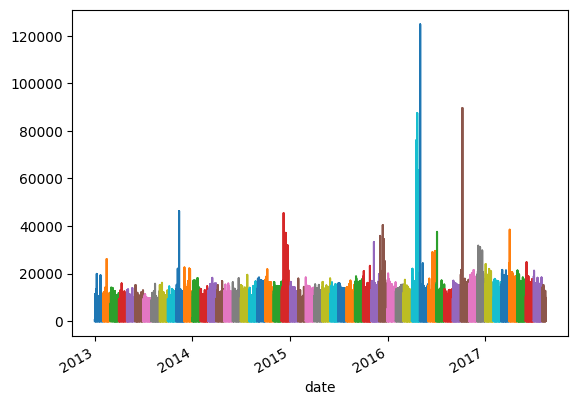

In [56]:
##Let's resample by month to see what's happening

sale__month=train_copy["sales"].resample("M")

sale__month.plot()

### multivariate

<Axes: >

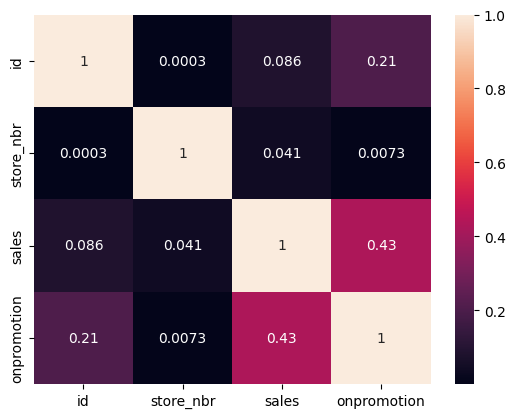

In [57]:
sns.heatmap(train_copy.corr(), annot= True)

## Answering Questions (Bivariate Analysis)


Q1.which city had the highest stores

Q2.which month did we have the highest sale

Q3.which store had the highest transaction?

Q4.which store had the highest sale?

Q5what is the most bought product?

### Q1.which city had the highest stores


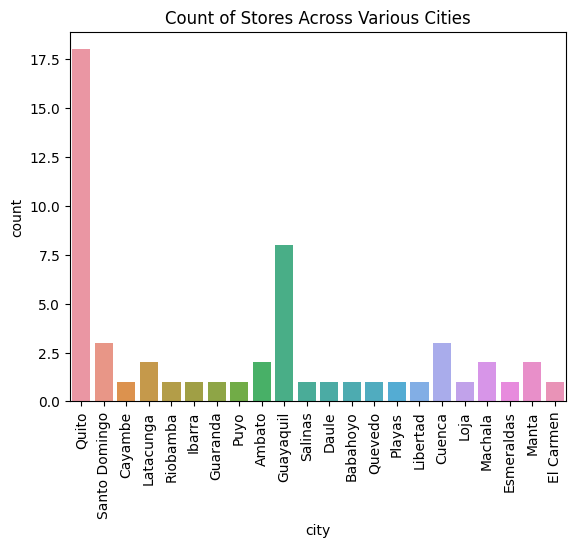

<Figure size 2000x1500 with 0 Axes>

In [58]:
sns.countplot("city", data=store)

plt.title("Count of Stores Across Various Cities")
plt.xticks(rotation=90)
plt.figure(figsize= (20,15))

plt.show()



Ans: From our analysis, we realized that Quilto had the highest number of sale


### Q2.which month did we have the highest sale


In [59]:
##to find this, we will group our unit sales by month across all the years

train_copy= df_train



In [60]:
train_copy["month"]= train_copy["date"].dt.month

In [61]:
train_copy

,id,date,store_nbr,family,sales,onpromotion,month
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1
1,1,2013-01-01,1,BABY CARE,0.000,0,1
2,2,2013-01-01,1,BEAUTY,0.000,0,1
3,3,2013-01-01,1,BEVERAGES,0.000,0,1
4,4,2013-01-01,1,BOOKS,0.000,0,1
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8


In [62]:
sales_by_month= train_copy.groupby("month").agg({"sales":"sum"}).sort_values(by="sales")



<Axes: xlabel='month', ylabel='sales'>

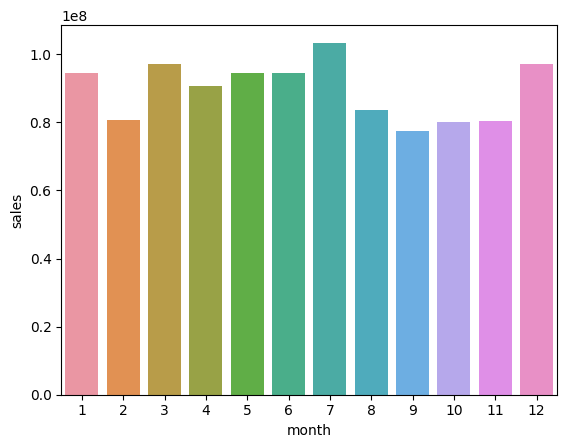

In [63]:
sns.barplot(data=sales_by_month, x= sales_by_month.index, y= "sales" )

- July recorded the highest Sale

### Q3.which store had the highest transaction?


Text(0.5, 1.0, 'Top 5 Store with the Highest Transactions')

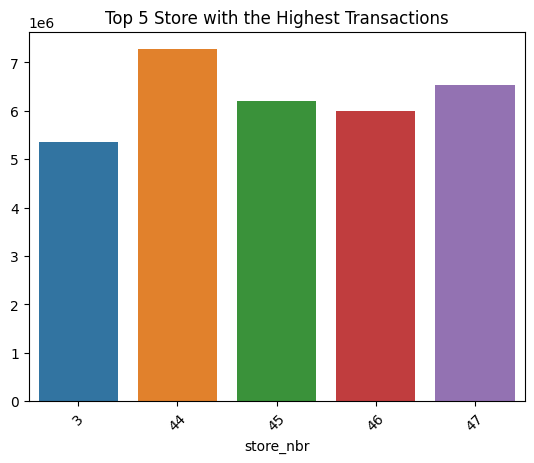

In [64]:
sto_tran= transactions.groupby("store_nbr")["transactions"].agg("sum").sort_values(ascending= False).head()

sns.barplot(x=sto_tran.index, y=sto_tran.values)

plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Transactions')

- Store 44 had the highest transaction

### Q4.which store had the highest sale?

Text(0.5, 1.0, 'Top 5 Store with the Highest Sale')

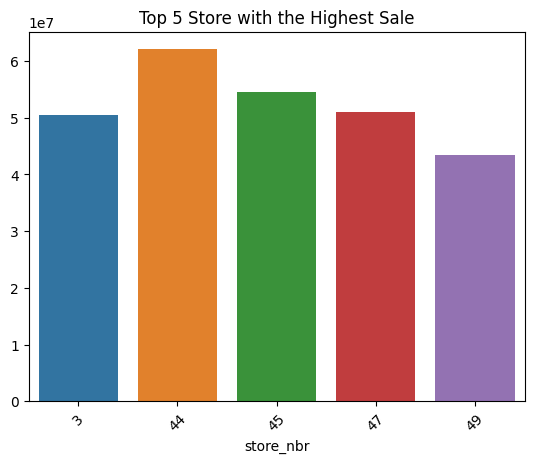

In [65]:
sto_sale= train_copy.groupby("store_nbr")["sales"].agg("sum").sort_values(ascending= False).head()

sns.barplot(x=sto_sale.index, y=sto_sale.values)


plt.xticks(rotation= 45)
plt.title('Top 5 Store with the Highest Sale')

- Store 44 had the highest number of unit sales. Also, it is worth noting that even though store 46 was part of the top 5 tstores with high transactions, it didn't make it to the list of stores with high number of unit sales 

### Q5.what is the most bought product per unit sale?

In [66]:
family_bought= train_copy[train_copy["sales"]!=0 ]

##Lets group and plot

family_sale = family_bought.groupby('family').size().reset_index(name='count').sort_values(by= "count")


fig_2= ex.scatter(family_sale, x='family', y='count', size='count', color= "family", hover_name='family',
                log_y=False, size_max=60)

fig_2.show()

## Univariate Modelling

The goal of this type of modelling is to forecast the general sales for Favorita irrespective of the product type, store number and other exogenous effects. Therefore, we will be using only time and the previous sales values to forecast the sales.

In [70]:
"""
Let's go ahead and group our  copy train data by date to give us an idea of the total unit sales 
for each day from all stores and all 

"""

train_sales= train_copy.groupby("date").agg({"sales": "sum"})



In [71]:
train_sales

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


In [72]:
##Let's plot this to see the graph


fig_3= ex.line(train_sales, x= train_sales.index, y= "sales", title= "Aggregated Sales With Slider")
  
fig_3.update_xaxes(rangeslider_visible= True, 
                 rangeselector= dict(
                     
                     buttons= list([
                         
                         dict(count= 1, label= "1y", step= "year", stepmode= "backward"), 
                         dict(count= 2, label= "2y", step= "year", stepmode= "backward"), 
                         dict(count= 3, label= "3y", step= "year", stepmode= "backward"),
                         dict(step="all")
                         
                     ])
                 
                 )
                
                
                )

fig_3.show()

#### Notes From The Plot:

- It is hard to detect any changes (trends and seasonality) due to the numerous data points. 

- Also, we can see some sharp drops at the beginning of each year. 

To help us see the form of the data more clearly, we will resample it to a weekly frequency

### Univariate Model 1: Using AutoARIMA

In [73]:
"""Before doing anything else, we will want to resample our train data by week to make it less computational expensive, 

and increase the accuracy of our model."""

##Weekly resampling:

weekly_sales= train_sales.resample("W").median()

In [74]:
weekly_sales

,sales
date,
2013-01-06,4.194057e+05
2013-01-13,3.183478e+05
2013-01-20,2.991295e+05
2013-01-27,2.962147e+05
2013-02-03,2.854602e+05
2013-02-10,3.215382e+05
2013-02-17,3.195979e+05
2013-02-24,3.138032e+05
2013-03-03,3.071109e+05


<Axes: xlabel='date'>

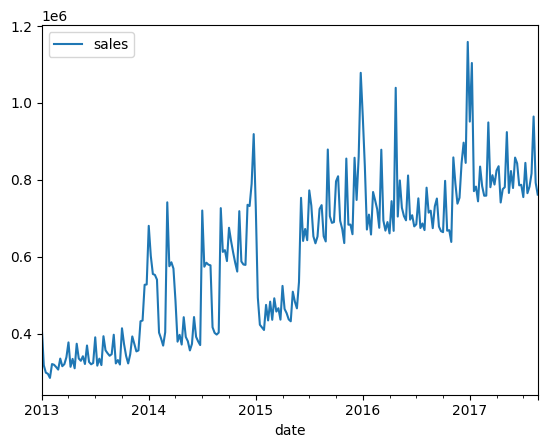

In [75]:
weekly_sales.plot()

In [76]:
### Our data seems to show high varaince; therfore, we will use a log transform the data

#### Stationarity Test

In [77]:
result= adf((weekly_sales))

result

(-1.5191614565562281,
 0.5240120455496716,
 13,
 228,
 {'1%': -3.4593607492757554,
  '5%': -2.8743015807562924,
  '10%': -2.5735714042782396},
 5773.27160696638)

- Our P-value is >0.05 so our data is  non-statioary with a 95% confidence level

#### Let's decompose our data to see the components 

<Figure size 2000x2000 with 0 Axes>

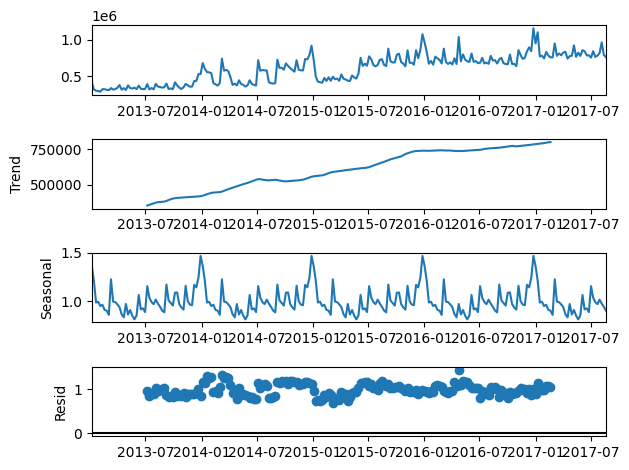

<Figure size 2000x2000 with 0 Axes>

In [78]:
decomposed_data= sma.tsa.seasonal_decompose(weekly_sales, model= "multiplicative")

decomposed_data.plot()

plt.figure(figsize= (20,20))

### Autocorrelation Charts

For us to have a better forecast, it is important that the current value has a relationship with its lagged values.This is why I am plotting the autocorrelation and partial autocorrelation charts.  

### ACF Graph

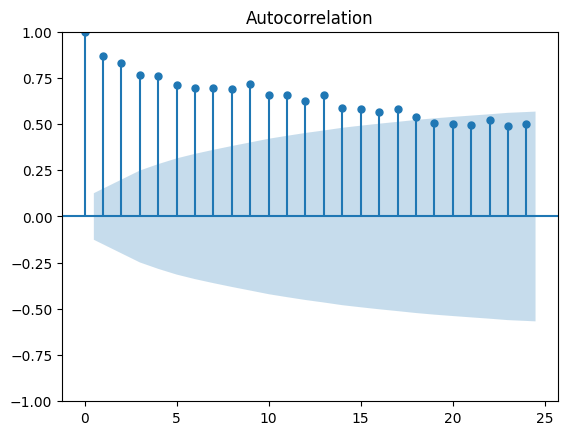

In [79]:
ACF_plot= ACF(weekly_sales["sales"])

In [80]:
##From our ACF we will use the q values from 1 to 15

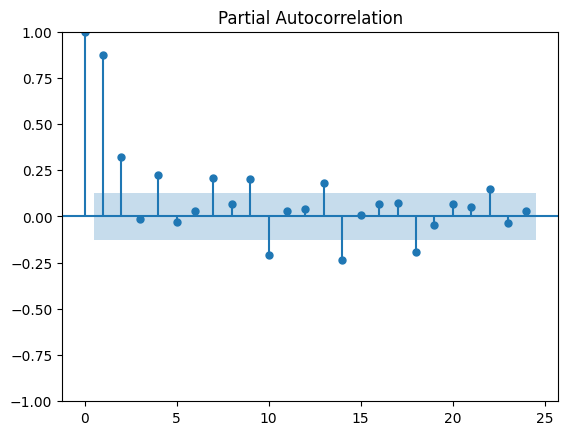

In [81]:
PACF_plot= PACF(weekly_sales)

We can see strong Partila autocorrelation at or p values lag 1,2,4,6

In [82]:
##train_sales_box

### Data Splitting

In [83]:



train, test= train_test_split(weekly_sales, test_size= 0.2, shuffle= False)

In [84]:
train

,sales
date,
2013-01-06,4.194057e+05
2013-01-13,3.183478e+05
2013-01-20,2.991295e+05
2013-01-27,2.962147e+05
2013-02-03,2.854602e+05
2013-02-10,3.215382e+05
2013-02-17,3.195979e+05
2013-02-24,3.138032e+05
2013-03-03,3.071109e+05


### Importing AutoArima Model

In [85]:


## Finding the best Arima model for the train_data

model_1= auto_arima(weekly_sales, m= 52, seasonal= True, start_p= 0, start_q= 0, max_p= 10, max_q= 15, max_d= 5, d= 1,
           
                   test= "adf", error_action= "ignore"
                   , suppress_warnings= True, stepwise= True, trace= True,  information_criterion='aic')

##basically, we are telling autoarima to perform a grid-cv kinda search to find the best parameters

##stepwise= true means the model will systematically take a look at each p,d,q values set to choose the best pdq combo based on AIC

## we choose the max p,d,q per information from our pACF and ACF plot


##result



Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[52] intercept   : AIC=6187.514, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=6229.846, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=6151.752, Time=0.51 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=6153.624, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=6227.898, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[52] intercept   : AIC=6194.158, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[52] intercept   : AIC=6153.741, Time=2.56 sec
 ARIMA(1,1,0)(1,0,1)[52] intercept   : AIC=6153.746, Time=0.93 sec
 ARIMA(1,1,0)(0,0,1)[52] intercept   : AIC=6156.757, Time=0.40 sec
 ARIMA(1,1,0)(2,0,1)[52] intercept   : AIC=6155.683, Time=9.91 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=6185.626, Time=0.45 sec
 ARIMA(2,1,0)(1,0,0)[52] intercept   : AIC=6153.507, Time=0.78 sec
 ARIMA(1,1,1)(1,0,0)[52] intercept   : AIC=6149.522, Time=1.81 sec
 ARIMA(1,1,1)(0,0,0)[52] intercept   : AIC=6183.171, Time=0.15 sec
 ARIMA(1,1,1)(2,0,0

In [86]:
model_1.fit(train)

ARIMA(order=(2, 1, 1), scoring_args={}, seasonal_order=(1, 0, 0, 52),
      suppress_warnings=True, with_intercept=False)

In [87]:
##Since the prediction returned a series, we will retrieve our time series index

result_1= model_1.predict(len(test))

In [88]:
result_1

2016-09-18    730228.006921
2016-09-25    735830.849545
2016-10-02    773458.995323
2016-10-09    778964.728868
2016-10-16    738472.867610
2016-10-23    731415.034327
2016-10-30    718592.141751
2016-11-06    796516.621958
2016-11-13    735834.793223
2016-11-20    736048.092428
2016-11-27    727262.893131
2016-12-04    797646.490859
2016-12-11    758851.042446
2016-12-18    798534.499358
2016-12-25    875839.290187
2017-01-01    835633.356038
2017-01-08    789873.882322
2017-01-15    731733.383365
2017-01-22    745457.169288
2017-01-29    727165.648161
2017-02-05    766277.319598
2017-02-12    758618.218291
2017-02-19    750428.243148
2017-02-26    733362.368464
2017-03-05    805169.232482
2017-03-12    740114.459821
2017-03-19    730750.174025
2017-03-26    738637.315373
2017-04-02    728227.693734
2017-04-09    757861.772386
2017-04-16    730545.766085
2017-04-23    862125.886234
2017-04-30    743709.887746
2017-05-07    776928.490728
2017-05-14    751759.894155
2017-05-21    744143

#### visualizing and testing our error for SARIMA model

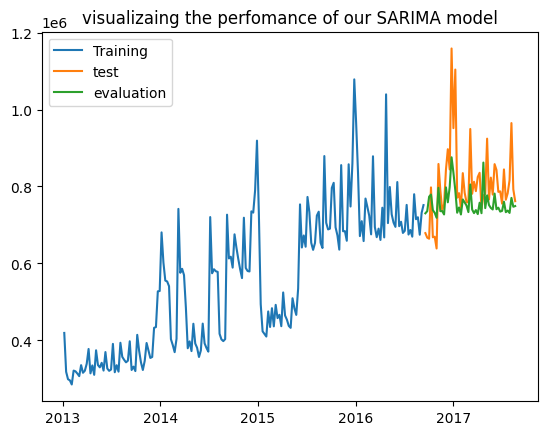

In [89]:
plt.plot(train, label= "Training")
plt.plot(test, label= "test")
plt.plot(result_1, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our SARIMA model")
plt.show()

In [90]:
##Checeking the performance of the non-transformed dataset


MEA_error_1= (MAE(test, result_1).round(2)/test.mean())* 100

RMSLE_error_1= np.sqrt(MSLE(test, result_1))


error_1= pd.DataFrame([["SARIMA", MEA_error_1, RMSLE_error_1]], columns= ["Model", "MAE", "RMSLE"])
               
error_1

,Model,MAE,RMSLE
0,SARIMA,sales 8.766755 dtype: float64,0.109081


### Forecasting  With SARIMA

In [91]:
## to forecast, we will fit our model to the whole dataset

In [92]:
model_1.fit(weekly_sales)

ARIMA(order=(2, 1, 1), scoring_args={}, seasonal_order=(1, 0, 0, 52),
      suppress_warnings=True, with_intercept=False)

In [93]:
weekly_sales

,sales
date,
2013-01-06,4.194057e+05
2013-01-13,3.183478e+05
2013-01-20,2.991295e+05
2013-01-27,2.962147e+05
2013-02-03,2.854602e+05
2013-02-10,3.215382e+05
2013-02-17,3.195979e+05
2013-02-24,3.138032e+05
2013-03-03,3.071109e+05


In [94]:
##We will let our model forecast over the next 20 weeks

forecast_dates= pd.date_range(start="2017-08-20", end= "2017-12-20", freq= "W" )

forecast_dates

DatetimeIndex(['2017-08-20', '2017-08-27', '2017-09-03', '2017-09-10',
               '2017-09-17', '2017-09-24', '2017-10-01', '2017-10-08',
               '2017-10-15', '2017-10-22', '2017-10-29', '2017-11-05',
               '2017-11-12', '2017-11-19', '2017-11-26', '2017-12-03',
               '2017-12-10', '2017-12-17'],
              dtype='datetime64[ns]', freq='W-SUN')

In [95]:
forecast_1= model_1.predict(n_periods= len(weekly_sales)+10 )

##start= len(weekly_sales), end=

In [96]:
forecast_1

2017-08-27    762486.953940
2017-09-03    787565.861005
2017-09-10    800627.385362
2017-09-17    774126.575283
2017-09-24    771702.318354
2017-10-01    772296.846339
2017-10-08    827260.211091
2017-10-15    776033.610775
2017-10-22    777351.430718
2017-10-29    765564.893986
2017-11-05    854352.365855
2017-11-12    827208.745381
2017-11-19    806501.320806
2017-11-26    812874.286576
2017-12-03    849186.268554
2017-12-10    870698.542942
2017-12-17    849611.264869
2017-12-24    976160.996967
2017-12-31    892877.561178
2018-01-07    954187.356398
2018-01-14    820171.721048
2018-01-21    824982.586127
2018-01-28    809576.113705
2018-02-04    845935.432249
2018-02-11    825393.108293
2018-02-18    815438.055529
2018-02-25    815548.306287
2018-03-04    892113.846085
2018-03-11    824377.477203
2018-03-18    836959.374055
2018-03-25    827144.043089
2018-04-01    841922.037516
2018-04-08    846337.327775
2018-04-15    808399.462717
2018-04-22    822318.373898
2018-04-29    824428

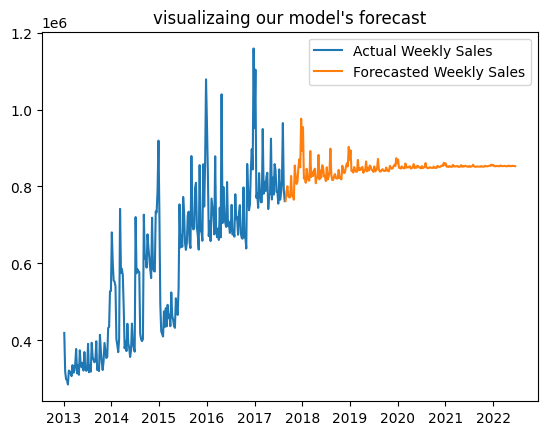

In [97]:
plt.plot(weekly_sales, label= "Actual Weekly Sales")
plt.plot(forecast_1, label= "Forecasted Weekly Sales")
plt.legend()
plt.title("visualizaing our model's forecast")
plt.show()

#### Final Notes:

- Our model did very well
- I could have used log transformation to increase the performance 
- We will also need to consider other time series to improve the performance (we will do this in the multivariate analysis)


### Univariate Modeling Using Facebook Prophet

In [98]:
train_sales

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


In [99]:
##Let's resample our data to a weekly frequency like we did earlier

fbp_sales= train_sales.resample("W").median()

In [100]:
fbp_sales

,sales
date,
2013-01-06,4.194057e+05
2013-01-13,3.183478e+05
2013-01-20,2.991295e+05
2013-01-27,2.962147e+05
2013-02-03,2.854602e+05
2013-02-10,3.215382e+05
2013-02-17,3.195979e+05
2013-02-24,3.138032e+05
2013-03-03,3.071109e+05


<Axes: xlabel='date'>

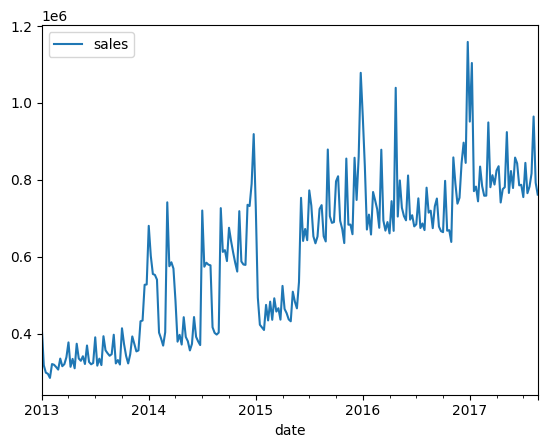

In [101]:
fbp_sales.plot()

facebook prophet only accepts data with the column names ds, and y; with ds representing the date and y representing the target variable. Therefore, we will have to rename our column as such

In [102]:
fbp_sales= train_sales.reset_index()[["date", "sales"]].rename({"date": "ds", "sales": "y"}, axis= "columns")

### Note:

- The resampling wouldn't work here since the date isn't the index

In [103]:
train_fbp, test_fbp= train_test_split(fbp_sales, test_size= 0.2, shuffle= False)

In [104]:
train_fbp

,ds,y
0,2013-01-01,2.511619e+03
1,2013-01-02,4.960924e+05
2,2013-01-03,3.614612e+05
3,2013-01-04,3.544597e+05
4,2013-01-05,4.773501e+05
...,...,...
1342,2016-09-07,7.385439e+05
1343,2016-09-08,5.958493e+05
1344,2016-09-09,6.589690e+05
1345,2016-09-10,9.159386e+05


In [105]:
test_fbp

,ds,y
1347,2016-09-12,6.787765e+05
1348,2016-09-13,6.034279e+05
1349,2016-09-14,6.242621e+05
1350,2016-09-15,5.683248e+05
1351,2016-09-16,6.919126e+05
1352,2016-09-17,8.992193e+05
1353,2016-09-18,1.018663e+06
1354,2016-09-19,6.811593e+05
1355,2016-09-20,6.509803e+05
1356,2016-09-21,6.669284e+05


<Axes: >

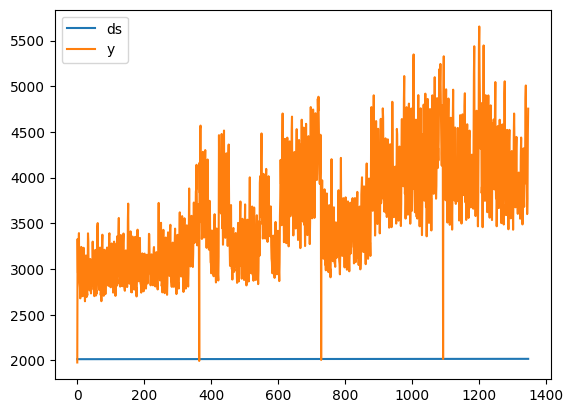

In [106]:
train_fbp.plot()

#### Importing Module

In [107]:
model_2= Prophet(yearly_seasonality= True, interval_width= 0.95)

In [108]:
model_2.fit(train_fbp)

04:56:07 - cmdstanpy - INFO - Chain [1] start processing
04:56:17 - cmdstanpy - INFO - Chain [1] done processing


In [109]:
##We will extract the date and let it predict over that so we can estimate our model's performance


test_date= pd.DataFrame(test_fbp["ds"])

In [110]:
test_date

,ds
1347,2016-09-12
1348,2016-09-13
1349,2016-09-14
1350,2016-09-15
1351,2016-09-16
1352,2016-09-17
1353,2016-09-18
1354,2016-09-19
1355,2016-09-20
1356,2016-09-21


#### Evaluating our model

In [111]:
eval_2= model_2.predict(test_date)

In [112]:
eval_2

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-09-12,806506.088097,621453.268059,1.019673e+06,806506.088097,806506.088097,14228.090766,14228.090766,14228.090766,-17556.860731,-17556.860731,-17556.860731,31784.951496,31784.951496,31784.951496,0.0,0.0,0.0,8.207342e+05
1,2016-09-13,806616.112578,583710.601207,9.843352e+05,806616.112578,806616.112578,-29275.831101,-29275.831101,-29275.831101,-62111.551173,-62111.551173,-62111.551173,32835.720072,32835.720072,32835.720072,0.0,0.0,0.0,7.773403e+05
2,2016-09-14,806726.137059,587127.335617,1.012232e+06,806690.595254,806726.137059,-9760.382404,-9760.382404,-9760.382404,-43509.275138,-43509.275138,-43509.275138,33748.892734,33748.892734,33748.892734,0.0,0.0,0.0,7.969658e+05
3,2016-09-15,806836.161540,530992.238796,9.138273e+05,806769.602163,806861.676859,-86211.348106,-86211.348106,-86211.348106,-120762.739733,-120762.739733,-120762.739733,34551.391627,34551.391627,34551.391627,0.0,0.0,0.0,7.206248e+05
4,2016-09-16,806946.186021,580458.201365,9.975858e+05,806791.917784,807008.216431,-24710.633797,-24710.633797,-24710.633797,-59978.090464,-59978.090464,-59978.090464,35267.456667,35267.456667,35267.456667,0.0,0.0,0.0,7.822356e+05
5,2016-09-17,807056.210502,770360.034491,1.158158e+06,806806.184484,807183.600134,161896.824283,161896.824283,161896.824283,125979.037534,125979.037534,125979.037534,35917.786748,35917.786748,35917.786748,0.0,0.0,0.0,9.689530e+05
6,2016-09-18,807166.234983,823669.382695,1.218166e+06,806846.535442,807344.794404,214458.317710,214458.317710,214458.317710,177939.479704,177939.479704,177939.479704,36518.838006,36518.838006,36518.838006,0.0,0.0,0.0,1.021625e+06
7,2016-09-19,807276.259464,617610.882336,1.017508e+06,806885.452934,807511.801357,19525.440026,19525.440026,19525.440026,-17556.860730,-17556.860730,-17556.860730,37082.300756,37082.300756,37082.300756,0.0,0.0,0.0,8.268017e+05
8,2016-09-20,807386.283945,580421.410318,1.004182e+06,806923.796890,807696.954200,-24496.780230,-24496.780230,-24496.780230,-62111.551173,-62111.551173,-62111.551173,37614.770942,37614.770942,37614.770942,0.0,0.0,0.0,7.828895e+05
9,2016-09-21,807496.308426,597785.829567,9.844022e+05,806927.063508,807873.638315,-5391.649481,-5391.649481,-5391.649481,-43509.275138,-43509.275138,-43509.275138,38117.625657,38117.625657,38117.625657,0.0,0.0,0.0,8.021047e+05


In [113]:
##getting the date and y_hat

result_2= eval_2[["ds", "yhat"]]

In [114]:
result_2

,ds,yhat
0,2016-09-12,8.207342e+05
1,2016-09-13,7.773403e+05
2,2016-09-14,7.969658e+05
3,2016-09-15,7.206248e+05
4,2016-09-16,7.822356e+05
5,2016-09-17,9.689530e+05
6,2016-09-18,1.021625e+06
7,2016-09-19,8.268017e+05
8,2016-09-20,7.828895e+05
9,2016-09-21,8.021047e+05


In [115]:
train_fbp= train_fbp.set_index("ds")

In [116]:
test_fbp=  test_fbp.set_index("ds")

In [117]:
result_2= result_2.set_index("ds")

#### visualizing our model's performance

Text(0.5, 1.0, 'visualizaing the perfomance of our FBP model')

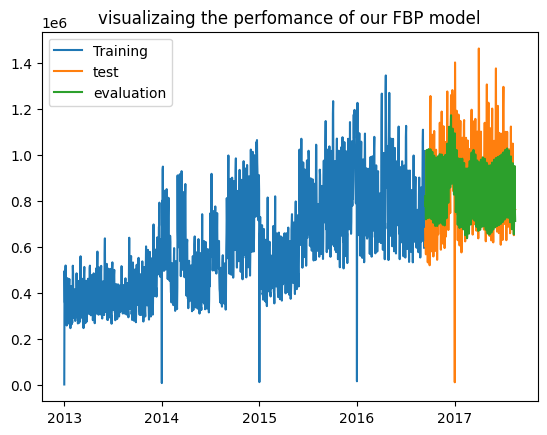

In [118]:
plt.plot(train_fbp, label= "Training")
plt.plot(test_fbp, label= "test")
plt.plot(result_2, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our FBP model")




#### Evaluating our mode

In [119]:

MEA_error_2= (MAE(test_fbp, result_2).round(2)/test.mean())* 100

RMSLE_error_2= np.sqrt(MSLE(test_fbp, result_2))


error_2= pd.DataFrame([["Facebook Prophet", MEA_error_2, RMSLE_error_2]], columns= ["Model", "MAE", "RMSLE"])
               
error_2

,Model,MAE,RMSLE
0,Facebook Prophet,sales 11.037861 dtype: float64,0.277686


#### Forecasting with FBP

In [120]:
##we will have the model learn the whole dataset


forecast_dates_2= pd.date_range(start="2017-08-16", end= "2018-01-20" )


In [121]:
forecast_dates_2

DatetimeIndex(['2017-08-16', '2017-08-17', '2017-08-18', '2017-08-19',
               '2017-08-20', '2017-08-21', '2017-08-22', '2017-08-23',
               '2017-08-24', '2017-08-25',
               ...
               '2018-01-11', '2018-01-12', '2018-01-13', '2018-01-14',
               '2018-01-15', '2018-01-16', '2018-01-17', '2018-01-18',
               '2018-01-19', '2018-01-20'],
              dtype='datetime64[ns]', length=158, freq='D')

In [122]:
forecast_dates_2= pd.DataFrame(forecast_dates_2)

In [123]:
forecast_dates_2.columns= ["ds"]

In [124]:
forecast_dates_2

,ds
0,2017-08-16
1,2017-08-17
2,2017-08-18
3,2017-08-19
4,2017-08-20
5,2017-08-21
6,2017-08-22
7,2017-08-23
8,2017-08-24
9,2017-08-25


In [125]:
forecast_2= model_2.predict(forecast_dates_2)

In [126]:
forecast_2

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-08-16,843694.362671,5.483785e+05,9.332931e+05,843694.362671,843694.362671,-109724.899456,-109724.899456,-109724.899456,-43509.275138,-43509.275138,-43509.275138,-66215.624318,-66215.624318,-66215.624318,0.0,0.0,0.0,7.339695e+05
1,2017-08-17,843804.387152,4.561939e+05,8.752755e+05,843804.387152,843804.387152,-184791.356083,-184791.356083,-184791.356083,-120762.739733,-120762.739733,-120762.739733,-64028.616350,-64028.616350,-64028.616350,0.0,0.0,0.0,6.590130e+05
2,2017-08-18,843914.411633,5.296440e+05,9.197779e+05,843914.411633,843930.988365,-121278.205124,-121278.205124,-121278.205124,-59978.090464,-59978.090464,-59978.090464,-61300.114660,-61300.114660,-61300.114660,0.0,0.0,0.0,7.226362e+05
3,2017-08-19,844024.436114,7.198747e+05,1.112847e+06,843999.230635,844085.242465,67908.860634,67908.860634,67908.860634,125979.037535,125979.037535,125979.037535,-58070.176901,-58070.176901,-58070.176901,0.0,0.0,0.0,9.119333e+05
4,2017-08-20,844134.460595,7.673277e+05,1.173572e+06,844064.831149,844262.450727,123552.998425,123552.998425,123552.998425,177939.479705,177939.479705,177939.479705,-54386.481280,-54386.481280,-54386.481280,0.0,0.0,0.0,9.676875e+05
5,2017-08-21,844244.485076,5.693334e+05,9.733584e+05,844100.242011,844461.015599,-67860.101069,-67860.101069,-67860.101069,-17556.860730,-17556.860730,-17556.860730,-50303.240339,-50303.240339,-50303.240339,0.0,0.0,0.0,7.763844e+05
6,2017-08-22,844354.509557,5.381540e+05,9.306998e+05,844130.816346,844640.770881,-107991.523374,-107991.523374,-107991.523374,-62111.551173,-62111.551173,-62111.551173,-45879.972201,-45879.972201,-45879.972201,0.0,0.0,0.0,7.363630e+05
7,2017-08-23,844464.534038,5.758506e+05,9.700339e+05,844176.757930,844803.135325,-84689.436249,-84689.436249,-84689.436249,-43509.275138,-43509.275138,-43509.275138,-41180.161111,-41180.161111,-41180.161111,0.0,0.0,0.0,7.597751e+05
8,2017-08-24,844574.558519,4.837032e+05,8.754680e+05,844180.771928,844993.219519,-157032.581886,-157032.581886,-157032.581886,-120762.739733,-120762.739733,-120762.739733,-36269.842153,-36269.842153,-36269.842153,0.0,0.0,0.0,6.875420e+05
9,2017-08-25,844684.583000,5.536630e+05,9.589581e+05,844195.425795,845168.018605,-91194.237630,-91194.237630,-91194.237630,-59978.090464,-59978.090464,-59978.090464,-31216.147166,-31216.147166,-31216.147166,0.0,0.0,0.0,7.534903e+05


In [127]:
result_2= forecast_2[["ds", "yhat"]]

In [128]:
##Let's make the date the index

result_2.set_index("ds", inplace=True)

In [129]:
result_2

,yhat
ds,
2017-08-16,7.339695e+05
2017-08-17,6.590130e+05
2017-08-18,7.226362e+05
2017-08-19,9.119333e+05
2017-08-20,9.676875e+05
2017-08-21,7.763844e+05
2017-08-22,7.363630e+05
2017-08-23,7.597751e+05
2017-08-24,6.875420e+05


In [130]:
fbp_sales

,ds,y
0,2013-01-01,2511.618999
1,2013-01-02,496092.417944
2,2013-01-03,361461.231124
3,2013-01-04,354459.677093
4,2013-01-05,477350.121229
...,...,...
1679,2017-08-11,826373.722022
1680,2017-08-12,792630.535079
1681,2017-08-13,865639.677471
1682,2017-08-14,760922.406081


In [131]:
print(fbp_sales["ds"].dtype)

datetime64[ns]


In [132]:
fbp_sales["ds"] = pd.to_datetime(fbp_sales["ds"])

In [133]:
fbp_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      1684 non-null   datetime64[ns]
 1   y       1684 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 26.4 KB


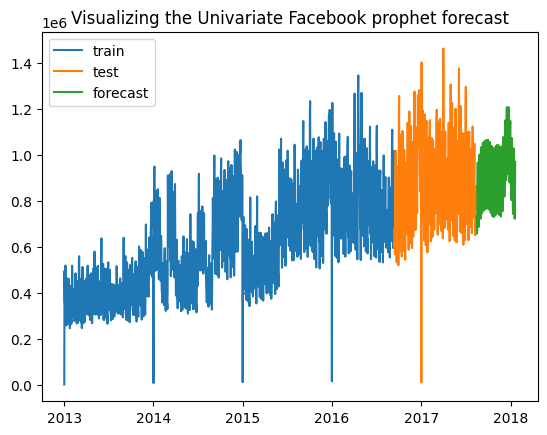

In [134]:
plt.plot(train_fbp, label= "train")
plt.plot(test_fbp, label= "test")
plt.plot(result_2, label= "forecast")
plt.title("Visualizing the Univariate Facebook prophet forecast")
plt.legend()

### Multivariate Forecasting

The idea here is to see how the other columns (exogenous variables) affect sales. We believe this will actually improve the accuracy of our models

##### Workflow:

- First, we will have an overview all the datasets again
- We will merge only the time series datasets since we are doing multivariate
- We will also do some prelimenary feature selection using granger's causality test
- Afterwards we will perform some feature engineering
- For models such as decision tree that has in-built feature selection we will leverage that as well

The algorithms we will be using for our modelling include:

- SARIMAX
- Facebook Prophet
- Decision Tree
- Random Forest

#####  Overview of datasets

In [135]:
oil

,dcoilwtico
date,
2013-01-01,93.14
2013-01-02,93.14
2013-01-03,92.97
2013-01-04,93.12
2013-01-07,93.20
...,...
2017-08-25,47.65
2017-08-28,46.40
2017-08-29,46.46


In [136]:
oil= oil.reset_index()

In [137]:
oil

,date,dcoilwtico
0,2013-01-01,93.14
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [138]:
transactions


,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [139]:
df_train

,id,date,store_nbr,family,sales,onpromotion,month
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1
1,1,2013-01-01,1,BABY CARE,0.000,0,1
2,2,2013-01-01,1,BEAUTY,0.000,0,1
3,3,2013-01-01,1,BEVERAGES,0.000,0,1
4,4,2013-01-01,1,BOOKS,0.000,0,1
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8


In [140]:
store

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [141]:
holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


We will only be considering:
 
- transaction
- oil
- train
- holidays
 
 
Also, since we have our target(sales) in the transaction column, we are going to filter all other datasets (from 2013-01-01 to 2017-08-15) to match the date of our train dataset. Doing this will help us see how the other variables affect our sales within the same time period. 

Also, we won't be considering the store dataset because we won't be forecasting the sales for each product across each store. We are trying to forecast the unit sales across all stores of favorita 

In [142]:

transac_train= transactions[(transactions["date"]>="2013-01-01") & (transactions["date"]<= "2017-08-15")]
oil_train= oil[(oil["date"]>="2013-01-01") & (oil["date"]<= "2017-08-15")]
holiday_train= holidays[(holidays["date"]>="2013-01-01") & (holidays["date"]<= "2017-08-15")]

##### Merging our datasets

In [143]:
merged_data1= pd.merge(df_train, transac_train, how= "outer", on= ["date", "store_nbr"])

merged_data2= pd.merge(merged_data1, holiday_train, how= "outer", on= "date")

merged_data3=  pd.merge(merged_data2, oil_train, how= "outer", on= "date")

In [144]:
merged_data3

,id,date,store_nbr,family,sales,onpromotion,month,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,0.0,2013-01-01,1.0,AUTOMOTIVE,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,1.0,2013-01-01,1.0,BABY CARE,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2.0,2013-01-01,1.0,BEAUTY,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,3.0,2013-01-01,1.0,BEVERAGES,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,4.0,2013-01-01,1.0,BOOKS,0.0,0.0,1.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054347,3000887.0,2017-08-15,9.0,SEAFOOD,16.0,0.0,8.0,2155.0,Holiday,Local,Riobamba,Fundacion de Riobamba,False,47.57
3054348,NaN,2013-12-25,NaN,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,99.18
3054349,NaN,2014-12-25,NaN,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,54.59
3054350,NaN,2015-12-25,NaN,NaN,NaN,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,36.36


In [145]:
##We will be dropping the store number and family column since we won't need them

merged_data= merged_data3.drop(["family", "store_nbr", "month"], axis= 1)

In [146]:
merged_data

,id,date,sales,onpromotion,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,0.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,1.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,3.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,4.0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
...,...,...,...,...,...,...,...,...,...,...,...
3054347,3000887.0,2017-08-15,16.0,0.0,2155.0,Holiday,Local,Riobamba,Fundacion de Riobamba,False,47.57
3054348,NaN,2013-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,99.18
3054349,NaN,2014-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,54.59
3054350,NaN,2015-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,36.36


In [147]:
merged_data= merged_data.drop("id", axis= 1)

In [148]:
merged_data

,date,sales,onpromotion,transactions,type,locale,locale_name,description,transferred,dcoilwtico
0,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,2013-01-01,0.0,0.0,NaN,Holiday,National,Ecuador,Primer dia del ano,False,93.14
...,...,...,...,...,...,...,...,...,...,...
3054347,2017-08-15,16.0,0.0,2155.0,Holiday,Local,Riobamba,Fundacion de Riobamba,False,47.57
3054348,2013-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,99.18
3054349,2014-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,54.59
3054350,2015-12-25,NaN,NaN,NaN,Holiday,National,Ecuador,Navidad,False,36.36


#### handling missing values

In [149]:
merged_data.isna().sum()

date                  0
sales                 4
onpromotion           4
transactions     249121
type            2551824
locale          2551824
locale_name     2551824
description     2551824
transferred     2551824
dcoilwtico       878527
dtype: int64

In [150]:
merged_data= merged_data.dropna(subset=["sales", "onpromotion"])

In [151]:
##For transactions, we will replace the na values with 0 since it means no transaction was recorded on the said date

merged_data["transactions"]= merged_data["transactions"].replace(np.nan, 0)

In [152]:
##We will be dropping the locale_name and description of holiday

merged_data= merged_data.drop(["locale_name", "description"], axis= 1)

In [153]:
merged_data.isna().sum()

date                  0
sales                 0
onpromotion           0
transactions          0
type            2551824
locale          2551824
transferred     2551824
dcoilwtico       878526
dtype: int64

With the holiday attributes, we will replace all the missing rows with not holidays, and for the transferred we will replace the missing rows with false since they were transferred as well. 

With the dcoilwtico, since the values closely match, we will perform a backfill

In [154]:

merged_data["type"]=merged_data["type"].replace(np.nan, "Not Holiday")

merged_data["locale"]=merged_data["locale"].replace(np.nan, "Not Holiday")

merged_data["transferred"]=merged_data["transferred"].replace(np.nan, "False")

merged_data["dcoilwtico"]= merged_data["dcoilwtico"].fillna(method= "bfill")


In [155]:
merged_data.isna().sum()

date            0
sales           0
onpromotion     0
transactions    0
type            0
locale          0
transferred     0
dcoilwtico      0
dtype: int64

In [156]:
##let's rename the type column to holiday type

merged_data= merged_data.rename(columns= {"type": "holiday"})

In [157]:
merged_data.columns

Index(['date', 'sales', 'onpromotion', 'transactions', 'holiday', 'locale',
       'transferred', 'dcoilwtico'],
      dtype='object')

#### Feature Selection using Granger causality test


Granger causality test is a test which validates the fact that one time series has an effect on another time series. I think this will be a good metric since we want our model to be as accurate as possible. 

Note the following:

- the null hypothesis is that y(the second variable) doesn't cause x. Therefore if the p-value is greater than 0.05 we accept the hypothesis, else we reject it. 

- We will be performing the test over 20 lags to help us make an informed decision

##### Assumptions:

We are going to assume holidays have an effect on sales. Therefore, we will check the causality of only the numeric columns

In [158]:
##I am going to aggregate and group the columns to make the test easy

In [159]:
merged= merged_data.groupby(["date", "holiday","locale", "transferred" ]).agg({"sales": "sum", "onpromotion": "sum","transactions": "sum","dcoilwtico": "mean" })

In [160]:
merged

,,,,sales,onpromotion,transactions,dcoilwtico
date,holiday,locale,transferred,,,,
2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0,93.14
2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0,93.14
2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0,92.97
2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0,93.12
2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0,93.20
...,...,...,...,...,...,...,...
2017-08-11,Transfer,National,False,826373.722022,14179.0,2955183.0,48.81
2017-08-12,Not Holiday,Not Holiday,False,792630.535079,8312.0,2967591.0,47.59
2017-08-13,Not Holiday,Not Holiday,False,865639.677471,9283.0,2837769.0,47.59


In [161]:
merged= merged.reset_index()

In [162]:
merged= merged.set_index("date")

In [163]:
merged

,holiday,locale,transferred,sales,onpromotion,transactions,dcoilwtico
date,,,,,,,
2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0,93.14
2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0,93.14
2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0,92.97
2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0,93.12
2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0,93.20
...,...,...,...,...,...,...,...
2017-08-11,Transfer,National,False,826373.722022,14179.0,2955183.0,48.81
2017-08-12,Not Holiday,Not Holiday,False,792630.535079,8312.0,2967591.0,47.59
2017-08-13,Not Holiday,Not Holiday,False,865639.677471,9283.0,2837769.0,47.59


In [164]:
##Let's perform our causality test

In [165]:
result_1= grangercausalitytests(merged[["sales", "onpromotion"]], maxlag= 20, verbose= False)


In [166]:
result_1

{1: ({'ssr_ftest': (103.20893433612063, 1.4012891568716958e-23, 1699.0, 1),
   'ssr_chi2test': (103.39117495001608, 2.7509739536125104e-24, 1),
   'lrtest': (100.37248099318822, 1.2627035668421978e-23, 1),
   'params_ftest': (103.20893433612105, 1.401289156871397e-23, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (134.94330047900272, 4.126128268327989e-55, 1696.0, 2),
   'ssr_chi2test': (270.68225721082973, 1.6676106963697826e-59, 2),
   'lrtest': (251.18803523843235, 2.8524049925153823e-55, 2),
   'params_ftest': (134.94330047900348, 4.126128268324881e-55, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (108.90722089684624, 1.7826498825082707e-64, 1693.0, 3),
   'ssr_chi2test': (328.0725496597258, 8.340532780870098e-71, 3),
   'lrtest': (299.97793363542587, 1.0058765068363655e-64, 3),
   'params_ftest': (108.90722089684637, 1.7826498825078146e-64, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0.,

In [167]:
for lag in result_1.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {result_1[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {result_1[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {result_1[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 103.20893433612105
Critical values: (1.401289156871397e-23, 1699.0, 1.0)
P-value: 1.401289156871397e-23

Lag 2:
F-statistic: 134.94330047900348
Critical values: (4.126128268324881e-55, 1696.0, 2.0)
P-value: 4.126128268324881e-55

Lag 3:
F-statistic: 108.90722089684637
Critical values: (1.7826498825078146e-64, 1693.0, 3.0)
P-value: 1.7826498825078146e-64

Lag 4:
F-statistic: 90.67625579579192
Critical values: (6.688327853225386e-70, 1690.0, 4.0)
P-value: 6.688327853225386e-70

Lag 5:
F-statistic: 82.95320613349206
Critical values: (4.831425335861109e-78, 1687.0, 5.0)
P-value: 4.831425335861109e-78

Lag 6:
F-statistic: 71.38526658285537
Critical values: (2.0091374294226924e-79, 1684.0, 6.0)
P-value: 2.0091374294226924e-79

Lag 7:
F-statistic: 30.47854224272859
Critical values: (6.541547849329343e-40, 1681.0, 7.0)
P-value: 6.541547849329343e-40

Lag 8:
F-statistic: 29.168247542055493
Critical values: (6.671016390878378e-43, 1678.0, 8.0)
P-value: 6.671016390878378e-43



#### Our Findings for the causality between sales and onpromotion:

- Over 20 lags, our p-value seem to be less than 0.05;therefore, we reject the null hypothesis for granger causality

- Also, since the p-value is less than 0.05, we accep the null hypothesis of our project, which is onpromotion has an effect on sales.

In basic terms, on-promotion has a causal effect on sales;therefore, we keep it

In [168]:
result_2= grangercausalitytests(merged[["sales", "transactions"]], maxlag= 20, verbose= False)


In [169]:
result_2

{1: ({'ssr_ftest': (89.9043774822756, 8.090881425762394e-21, 1699.0, 1),
   'ssr_chi2test': (90.06312564734142, 2.3068122392988646e-21, 1),
   'lrtest': (87.76109426990297, 7.385749828878128e-21, 1),
   'params_ftest': (89.90437748226036, 8.090881425821723e-21, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (52.93618075236795, 5.0020365530931137e-23, 1696.0, 2),
   'ssr_chi2test': (106.18448521200222, 8.756529282883082e-24, 2),
   'lrtest': (103.00199293615151, 4.2993363379975035e-23, 2),
   'params_ftest': (52.93618075236527, 5.0020365531051266e-23, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (35.80843532795205, 1.9561196183773678e-22, 1693.0, 3),
   'ssr_chi2test': (107.86947440788862, 3.1535676869971835e-23, 3),
   'lrtest': (104.58538540357404, 1.604509280190379e-22, 3),
   'params_ftest': (35.80843532794179, 1.9561196184052632e-22, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 

In [170]:
for lag in result_2.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {result_2[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {result_2[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {result_2[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 89.90437748226036
Critical values: (8.090881425821723e-21, 1699.0, 1.0)
P-value: 8.090881425821723e-21

Lag 2:
F-statistic: 52.93618075236527
Critical values: (5.0020365531051266e-23, 1696.0, 2.0)
P-value: 5.0020365531051266e-23

Lag 3:
F-statistic: 35.80843532794179
Critical values: (1.9561196184052632e-22, 1693.0, 3.0)
P-value: 1.9561196184052632e-22

Lag 4:
F-statistic: 23.68662369137413
Critical values: (4.400575857338455e-19, 1690.0, 4.0)
P-value: 4.400575857338455e-19

Lag 5:
F-statistic: 24.827271470771024
Critical values: (3.315860047506714e-24, 1687.0, 5.0)
P-value: 3.315860047506714e-24

Lag 6:
F-statistic: 20.938240031278
Critical values: (8.659682862329463e-24, 1684.0, 6.0)
P-value: 8.659682862329463e-24

Lag 7:
F-statistic: 10.583191338582017
Critical values: (4.3917757193922965e-13, 1681.0, 7.0)
P-value: 4.3917757193922965e-13

Lag 8:
F-statistic: 28.621116566498984
Critical values: (4.346167902847133e-42, 1678.0, 8.0)
P-value: 4.346167902847133e-42

L

#### Our Findings for the causality between sales and transaction:

- Over 20 lags, our p-value seem to be less than 0.05;therefore, we reject the null hypothesis.

In basic terms, transaction has a causal effect on sales;therefore, we keep it

In [171]:
result_3= grangercausalitytests(merged[["sales", "dcoilwtico"]], maxlag= 20, verbose= False)


In [172]:
result_3

{1: ({'ssr_ftest': (168.42279223040748, 8.615920157363876e-37, 1699.0, 1),
   'ssr_chi2test': (168.7201838588308, 1.4083063659741052e-38, 1),
   'lrtest': (160.8721066774815, 7.296367003949172e-37, 1),
   'params_ftest': (168.4227922304081, 8.615920157361917e-37, 1699.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (91.52476099596376, 1.792682541701409e-38, 1696.0, 2),
   'ssr_chi2test': (183.58917270534712, 1.361813635801004e-40, 2),
   'lrtest': (174.34150850927836, 1.387466301497571e-38, 2),
   'params_ftest': (91.52476099595154, 1.7926825417212293e-38, 1696.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (44.02874174904738, 2.1439925378622883e-27, 1693.0, 3),
   'ssr_chi2test': (132.63235848797498, 1.4647121111443374e-28, 3),
   'lrtest': (127.7127201128169, 1.6824951561982133e-27, 3),
   'params_ftest': (44.028741749043554, 2.1439925378734855e-27, 1693.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0.,

In [173]:
##looping through to figure out my f-stat, critical value, and p-value

for lag in result_3.keys():
    print(f"Lag {lag}:")
    print(f"F-statistic: {result_3[lag][0]['params_ftest'][0]}")
    print(f"Critical values: {result_3[lag][0]['params_ftest'][1:]}")
    print(f"P-value: {result_3[lag][0]['params_ftest'][1]}")
    print()

Lag 1:
F-statistic: 168.4227922304081
Critical values: (8.615920157361917e-37, 1699.0, 1.0)
P-value: 8.615920157361917e-37

Lag 2:
F-statistic: 91.52476099595154
Critical values: (1.7926825417212293e-38, 1696.0, 2.0)
P-value: 1.7926825417212293e-38

Lag 3:
F-statistic: 44.028741749043554
Critical values: (2.1439925378734855e-27, 1693.0, 3.0)
P-value: 2.1439925378734855e-27

Lag 4:
F-statistic: 28.259060605435216
Critical values: (9.390557030748737e-23, 1690.0, 4.0)
P-value: 9.390557030748737e-23

Lag 5:
F-statistic: 16.58994351263499
Critical values: (5.068242606592518e-16, 1687.0, 5.0)
P-value: 5.068242606592518e-16

Lag 6:
F-statistic: 6.829691452815372
Critical values: (3.574401191146233e-07, 1684.0, 6.0)
P-value: 3.574401191146233e-07

Lag 7:
F-statistic: 2.7243571039971863
Critical values: (0.008214640909998341, 1681.0, 7.0)
P-value: 0.008214640909998341

Lag 8:
F-statistic: 2.709165242300286
Critical values: (0.005771458526760011, 1678.0, 8.0)
P-value: 0.005771458526760011

Lag 9

#### Our Findings for the causality between oil and onpromotion:

- Over 20 lags, our p-value seem to be greater than 0.05 from the 14th lag;therefore, we accept the null hypothesis amd drop the column

In basic terms, oil has no causal effect on sales;therefore, we drop it

In [174]:
##Our final dataset

final_data= merged.drop("dcoilwtico", axis= 1)

In [175]:
final_data.to_csv("Desktop/final_dataset.csv")

### Feature Engineering

In this section, we will:
    
- Create new features, and encode our categorical column

#### Feature Encoding

In [176]:
final_data

,holiday,locale,transferred,sales,onpromotion,transactions
date,,,,,,
2013-01-01,Holiday,National,False,2511.618999,0.0,25410.0
2013-01-02,Not Holiday,Not Holiday,False,496092.417944,0.0,3076095.0
2013-01-03,Not Holiday,Not Holiday,False,361461.231124,0.0,2590632.0
2013-01-04,Not Holiday,Not Holiday,False,354459.677093,0.0,2590302.0
2013-01-05,Work Day,National,False,477350.121229,0.0,3087909.0
...,...,...,...,...,...,...
2017-08-11,Transfer,National,False,826373.722022,14179.0,2955183.0
2017-08-12,Not Holiday,Not Holiday,False,792630.535079,8312.0,2967591.0
2017-08-13,Not Holiday,Not Holiday,False,865639.677471,9283.0,2837769.0


###### Encoding the transferred column

In [177]:
final_data[["transferred"]]

,transferred
date,
2013-01-01,False
2013-01-02,False
2013-01-03,False
2013-01-04,False
2013-01-05,False
...,...
2017-08-11,False
2017-08-12,False
2017-08-13,False


In [178]:
###First, we will replace the string "False" with the Boolean False and then replace false with 0 and true with 1

In [179]:
final_data["transferred"]=final_data["transferred"].replace("False", False)

In [180]:
##let's replace False with 0 and true with 1

In [181]:
final_data["transferred"]=final_data["transferred"].replace(False, 0)
final_data["transferred"]=final_data["transferred"].replace(True, 1)

##### Encoding the holiday attribute:

In [182]:
final_data["holiday"].unique()

array(['Holiday', 'Not Holiday', 'Work Day', 'Additional', 'Event',
       'Transfer', 'Bridge'], dtype=object)

Since there are various attributes in the column, we will use a binary encoder

In [183]:
from category_encoders.binary import BinaryEncoder

In [184]:
##creating an instance and telling the encoder which column to target 

encoder_1= BinaryEncoder(cols= "holiday")

In [185]:
##perfoming encoding 

encoded_data_1= encoder_1.fit_transform(final_data)

In [186]:
encoded_data_1

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2013-01-01,0,0,1,National,0,2511.618999,0.0,25410.0
2013-01-02,0,1,0,Not Holiday,0,496092.417944,0.0,3076095.0
2013-01-03,0,1,0,Not Holiday,0,361461.231124,0.0,2590632.0
2013-01-04,0,1,0,Not Holiday,0,354459.677093,0.0,2590302.0
2013-01-05,0,1,1,National,0,477350.121229,0.0,3087909.0
...,...,...,...,...,...,...,...,...
2017-08-11,1,1,0,National,0,826373.722022,14179.0,2955183.0
2017-08-12,0,1,0,Not Holiday,0,792630.535079,8312.0,2967591.0
2017-08-13,0,1,0,Not Holiday,0,865639.677471,9283.0,2837769.0


##### encoding the locale column

In [187]:
final_data["locale"].unique()

array(['National', 'Not Holiday', 'Local', 'Regional'], dtype=object)

This looks heiriacal; therefore, I will use national as the highest value, and not holiday having the lowest value

In [188]:
##encoding

from sklearn.preprocessing import OrdinalEncoder

In [189]:
##creating a rank
rank= ["National", "Regional", "Local", "Not Holiday"]

In [190]:
##creating an instance
encoder_2= OrdinalEncoder(categories=[rank])

In [191]:
##let's encode

##I am using two square-brackets because the ordinal-encoder takes two-d arrays 

encoded_data_1[["locale"]]=encoder_2.fit_transform(encoded_data_1[["locale"]])


In [192]:

encoded_data_1


,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
date,,,,,,,,
2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0
2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0
2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0
2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0
2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0
...,...,...,...,...,...,...,...,...
2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0
2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0
2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0


We are all set; we can go ahead and create some new features 

In [193]:
df_final= encoded_data_1

#### Feature Engineering

<Axes: xlabel='date'>

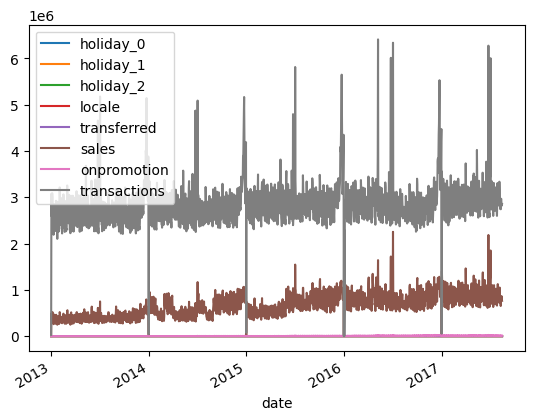

In [194]:
df_final.plot()

In [195]:
##Last check for missing values 

df_final.isna().sum()

holiday_0       0
holiday_1       0
holiday_2       0
locale          0
transferred     0
sales           0
onpromotion     0
transactions    0
dtype: int64

In [196]:
##since we will be using the data to create new features, we will reset our index

df_final= df_final.reset_index()

In [197]:
df_final

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0
...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0


In [198]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1703 entries, 0 to 1702
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          1703 non-null   datetime64[ns]
 1   holiday_0     1703 non-null   int64         
 2   holiday_1     1703 non-null   int64         
 3   holiday_2     1703 non-null   int64         
 4   locale        1703 non-null   float64       
 5   transferred   1703 non-null   int64         
 6   sales         1703 non-null   float64       
 7   onpromotion   1703 non-null   float64       
 8   transactions  1703 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(4)
memory usage: 119.9 KB


In [199]:
df_final['day']=df_final['date'].dt.day
df_final['month']= df_final['date'].dt.month
df_final['day_of_month']= df_final['date'].dt.day
df_final['day_of_year']= df_final['date'].dt.dayofyear
df_final['week_of_year']= df_final['date'].dt.isocalendar().week.astype(int)
df_final['day_of_week']= df_final['date'].dt.dayofweek
df_final['is_weekend']= np.where(df_final['day_of_week'] > 4,1,0)
df_final['is_month_start']= df_final['date'].dt.is_month_start.astype(int)
df_final['is_month_end']= df_final['date'].dt.is_month_end.astype(int)
df_final['quarter']= df_final['date'].dt.quarter
df_final['is_quarter_start']= df_final['date'].dt.is_quarter_start.astype(int)
df_final['is_quarter_end']= df_final['date'].dt.is_quarter_end.astype(int)
df_final['is_year_start']= df_final['date'].dt.is_year_start.astype(int)
df_final['is_year_end']= df_final['date'].dt.is_year_end.astype(int)

    



In [200]:
df_final

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


In [201]:
##We will make time our index

timed_final= df_final.set_index("date")

### Multivariate Modeling 

In this section, we are going to compare one statistical method with two machine learning models. 

##### Here we will develop a model using:

- Facebook Prophet
- SARIMAX
- Decision Trees
- Random Forest
Again,we are trying to see if our statistical models outperform our machine learning models in multivariate

#### Multivariate With Facebook Prophet

In [202]:
df_final

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


In [203]:
fbp_data= df_final.copy()

In [204]:
fbp_data= fbp_data.rename(columns={"date": "ds", "sales": "y"})

In [205]:
fbp_data

,ds,holiday_0,holiday_1,holiday_2,locale,transferred,y,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


#### Data Splitting  For Facebook Prophet

In [206]:
##first, let's get our exogenous and endogenous variables

fbp_exo= fbp_data.drop(["y", "ds"], axis= 1)

fbp_endo= fbp_data.y

In [207]:
fbp_train, fbp_test= train_test_split(fbp_data, test_size= 0.2, shuffle= False)

In [208]:
fbp_test.shape

(341, 23)

In [209]:
model_3= Prophet(interval_width= 0.95, yearly_seasonality= True)

In [210]:
exo_cols= ['day', 'month', 'day_of_month', 'day_of_year', 'week_of_year', 'day_of_week', 'is_weekend', 
           'is_month_start', 'is_month_end',
           'quarter', 'is_quarter_start', 'is_quarter_end', 'is_year_start', 'is_year_end']

In [211]:
for cols in exo_cols:
    model_3.add_regressor(cols, standardize= False)

In [212]:
model_3.extra_regressors

OrderedDict([('day',
              {'prior_scale': 10.0,
               'standardize': False,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'additive'}),
             ('month',
              {'prior_scale': 10.0,
               'standardize': False,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'additive'}),
             ('day_of_month',
              {'prior_scale': 10.0,
               'standardize': False,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'additive'}),
             ('day_of_year',
              {'prior_scale': 10.0,
               'standardize': False,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'additive'}),
             ('week_of_year',
              {'prior_scale': 10.0,
               'standardize': False,
               'mu': 0.0,
               'std': 1.0,
               'mode': 'additive'}),
             ('day_of_week',
              {'prior_s

In [213]:
model_3.fit(fbp_train)

04:56:54 - cmdstanpy - INFO - Chain [1] start processing
04:56:56 - cmdstanpy - INFO - Chain [1] done processing


In [214]:
model_3.params

OrderedDict([('lp__', array([[3427.35]])),
             ('k', array([[0.248845]])),
             ('m', array([[0.0183222]])),
             ('delta',
              array([[-0.070687  , -0.0419176 ,  0.00356267,  0.0128098 ,  0.0165681 ,
                       0.0682553 ,  0.0621087 ,  0.00134283, -0.0177856 , -0.024779  ,
                      -0.0230802 , -0.00751563, -0.039423  , -0.0527963 , -0.0365424 ,
                      -0.0124895 ,  0.0425977 ,  0.142959  ,  0.14298   ,  0.0632295 ,
                      -0.00591324, -0.0535566 , -0.102837  , -0.109631  , -0.126181  ]])),
             ('sigma_obs', array([[0.0484009]])),
             ('beta',
              array([[ 5.74142e-03,  1.58306e-02,  1.81172e-03,  1.24211e-02,
                       2.21340e-03,  6.30420e-03, -1.68625e-02,  1.93603e-02,
                      -4.78314e-03,  1.95368e-03,  9.05221e-04,  9.21458e-03,
                      -2.31656e-03,  1.85680e-03, -8.65267e-03, -2.51852e-04,
                      -5.163

In [215]:
###We want to get only the exogenouse variables and the date without the target 

test_values= fbp_test.drop("y", axis= 1)

In [216]:
test_values

,ds,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
1362,2016-09-12,0,1,0,3.0,0,5902.0,2545125.0,12,9,12,256,37,0,0,0,0,3,0,0,0,0
1363,2016-09-13,0,1,0,3.0,0,7836.0,2443056.0,13,9,13,257,37,1,0,0,0,3,0,0,0,0
1364,2016-09-14,0,1,0,3.0,0,13238.0,2412168.0,14,9,14,258,37,2,0,0,0,3,0,0,0,0
1365,2016-09-15,0,1,0,3.0,0,8373.0,2466453.0,15,9,15,259,37,3,0,0,0,3,0,0,0,0
1366,2016-09-16,0,1,0,3.0,0,14453.0,2666037.0,16,9,16,260,37,4,0,0,0,3,0,0,0,0
1367,2016-09-17,0,1,0,3.0,0,9645.0,3111834.0,17,9,17,261,37,5,1,0,0,3,0,0,0,0
1368,2016-09-18,0,1,0,3.0,0,10453.0,3048375.0,18,9,18,262,37,6,1,0,0,3,0,0,0,0
1369,2016-09-19,0,1,0,3.0,0,8924.0,2516415.0,19,9,19,263,38,0,0,0,0,3,0,0,0,0
1370,2016-09-20,0,1,0,3.0,0,10992.0,2526876.0,20,9,20,264,38,1,0,0,0,3,0,0,0,0
1371,2016-09-21,0,1,0,3.0,0,16166.0,2516580.0,21,9,21,265,38,2,0,0,0,3,0,0,0,0


In [217]:
eval_3= model_3.predict(test_values)

In [218]:
model_3_eval_data= eval_3[["ds", "yhat"]]

In [219]:

model_3_eval_data

,ds,yhat
0,2016-09-12,8.380106e+05
1,2016-09-13,7.973920e+05
2,2016-09-14,8.146813e+05
3,2016-09-15,7.400255e+05
4,2016-09-16,7.943865e+05
5,2016-09-17,9.744673e+05
6,2016-09-18,1.026267e+06
7,2016-09-19,8.191267e+05
8,2016-09-20,7.748828e+05
9,2016-09-21,7.886872e+05


In [220]:
##Let's get only the sales and time of both for better evaluation

model_3_train_data= fbp_train[["ds", "y"]]
model_3_test_data= fbp_test[["ds", "y"]]

In [221]:
##Let's make the time the index for easy evaluation
model_3_train_data= model_3_train_data.set_index("ds")
model_3_test_data= model_3_test_data.set_index("ds")
model_3_eval_data= model_3_eval_data.set_index("ds")

#### Using facebook prophet

Text(0.5, 1.0, 'visualizaing the perfomance of our model')

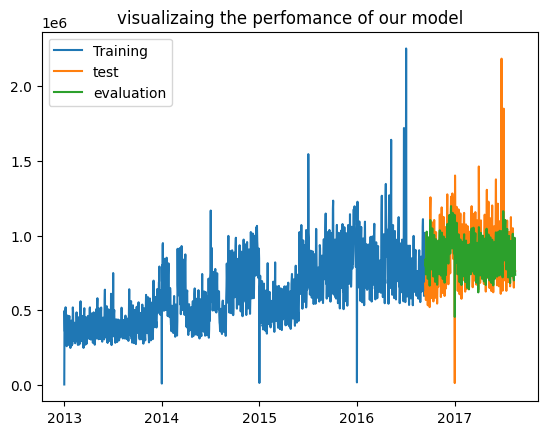

In [222]:
plt.plot(model_3_train_data, label= "Training")
plt.plot(model_3_test_data, label= "test")
plt.plot(model_3_eval_data, label= "evaluation")
plt.legend()
plt.title("visualizaing the perfomance of our model")

In [223]:

MEA_error_3= (MAE(model_3_test_data, model_3_eval_data)/model_3_test_data.mean())* 100

RMSLE_error_3= np.sqrt(MSLE(model_3_test_data, model_3_eval_data))


error_3= pd.DataFrame([["Facebook Prophet with exo", MEA_error_3, RMSLE_error_3]], columns= ["Model", "MAE", "RMSLE"])
               
error_3

,Model,MAE,RMSLE
0,Facebook Prophet with exo,y 9.859424 dtype: float64,0.234073


#### Assumption:

- For us to make our forecast, we will have to get the future values for our exogenous features. This can be a tedious work since the features are numerous; therefore, what we will do is to use the previous values of the exogenous variables in our test data and use that for our forecast

### Multivariate modelling with Sarimax

In [224]:
df_final

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


In [225]:
##agian, we are going to resample by week 

df_weekly= df_final.set_index("date")

In [226]:
df_weekly= df_weekly.resample("W").median()

In [227]:
df_weekly

,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
date,,,,,,,,,,,,,,,,,,,,,,
2013-01-06,0.0,1.0,0.0,3.0,0.0,4.194057e+05,0.0,2787972.0,3.5,1.0,3.5,3.5,1.0,3.5,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-13,0.0,1.0,0.0,3.0,0.0,3.183478e+05,0.0,2386725.0,10.0,1.0,10.0,10.0,2.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-20,0.0,1.0,0.0,3.0,0.0,2.991295e+05,0.0,2355243.0,17.0,1.0,17.0,17.0,3.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-27,0.0,1.0,0.0,3.0,0.0,2.962147e+05,0.0,2352009.0,24.0,1.0,24.0,24.0,4.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-03,0.0,1.0,0.0,3.0,0.0,2.854602e+05,0.0,2339304.0,28.0,1.0,28.0,31.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-10,0.0,1.0,0.0,3.0,0.0,3.215382e+05,0.0,2485890.0,7.0,2.0,7.0,38.0,6.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-17,0.0,1.0,0.0,3.0,0.0,3.195979e+05,0.0,2555817.0,14.0,2.0,14.0,45.0,7.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-24,0.0,1.0,0.0,3.0,0.0,3.138032e+05,0.0,2435796.0,21.0,2.0,21.0,52.0,8.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-03-03,0.0,1.0,0.0,3.0,0.0,3.071109e+05,0.0,2381511.0,25.0,2.0,25.0,59.0,9.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [228]:
df_weekly_endog= df_weekly[["sales"]]

df_weekly_exog= df_weekly.drop("sales", axis= 1)

In [229]:
df_weekly_endog

,sales
date,
2013-01-06,4.194057e+05
2013-01-13,3.183478e+05
2013-01-20,2.991295e+05
2013-01-27,2.962147e+05
2013-02-03,2.854602e+05
2013-02-10,3.215382e+05
2013-02-17,3.195979e+05
2013-02-24,3.138032e+05
2013-03-03,3.071109e+05


In [230]:
df_weekly_exog

,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
date,,,,,,,,,,,,,,,,,,,,,
2013-01-06,0.0,1.0,0.0,3.0,0.0,0.0,2787972.0,3.5,1.0,3.5,3.5,1.0,3.5,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-13,0.0,1.0,0.0,3.0,0.0,0.0,2386725.0,10.0,1.0,10.0,10.0,2.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-20,0.0,1.0,0.0,3.0,0.0,0.0,2355243.0,17.0,1.0,17.0,17.0,3.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-01-27,0.0,1.0,0.0,3.0,0.0,0.0,2352009.0,24.0,1.0,24.0,24.0,4.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-03,0.0,1.0,0.0,3.0,0.0,0.0,2339304.0,28.0,1.0,28.0,31.0,5.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-10,0.0,1.0,0.0,3.0,0.0,0.0,2485890.0,7.0,2.0,7.0,38.0,6.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-17,0.0,1.0,0.0,3.0,0.0,0.0,2555817.0,14.0,2.0,14.0,45.0,7.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-02-24,0.0,1.0,0.0,3.0,0.0,0.0,2435796.0,21.0,2.0,21.0,52.0,8.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2013-03-03,0.0,1.0,0.0,3.0,0.0,0.0,2381511.0,25.0,2.0,25.0,59.0,9.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [231]:
##data splitting

endog_train, endog_test= train_test_split(df_weekly_endog, test_size= 0.2, shuffle= False)

exog_train, exog_test= train_test_split(df_weekly_exog, test_size= 0.2, shuffle= False)

In [232]:
endog_test

,sales
date,
2016-09-18,6.787765e+05
2016-09-25,6.669284e+05
2016-10-02,6.642174e+05
2016-10-09,7.976122e+05
2016-10-16,6.679542e+05
2016-10-23,6.694535e+05
2016-10-30,6.388383e+05
2016-11-06,8.584682e+05
2016-11-13,8.198639e+05


In [233]:

model_4= SARIMAX(endog=endog_train, exog=exog_train, order=(2, 1, 1), seasonal_order=(1, 0, 0, 52), frequency= "W")

In [234]:
Model_4=model_4.fit()

In [235]:
eval_4= Model_4.predict( start= "2016-09-18", end="2017-08-20", exog=exog_test)

In [236]:
eval_4= pd.DataFrame(eval_4)

In [237]:
eval_4.columns= ["sales"]

In [238]:
eval_4

,sales
2016-09-18,7.107046e+05
2016-09-25,7.064946e+05
2016-10-02,6.634255e+05
2016-10-09,7.399822e+05
2016-10-16,7.102984e+05
2016-10-23,6.765390e+05
2016-10-30,6.945259e+05
2016-11-06,1.432203e+06
2016-11-13,9.133854e+05
2016-11-20,7.610928e+05


#### Visualizing The Perfomance of Our Model

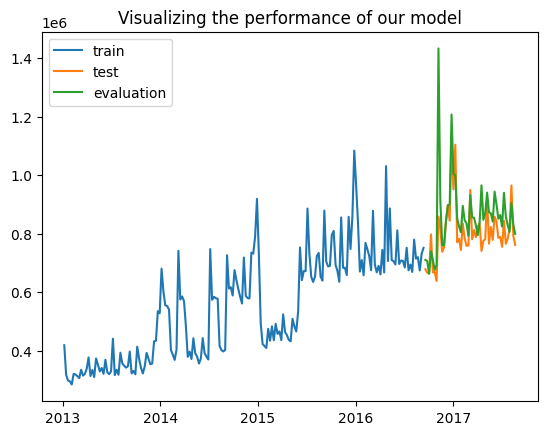

In [239]:
plt.plot(endog_train, label= "train")
plt.plot(endog_test, label= "test")
plt.plot(eval_4, label= "evaluation")
plt.title("Visualizing the performance of our model")
plt.legend()

In [240]:

MEA_error_4= (MAE(endog_test, eval_4)/endog_test.mean())* 100

RMSLE_error_4= np.sqrt(MSLE(endog_test, eval_4))


error_4= pd.DataFrame([["SARIMAX", MEA_error_4, RMSLE_error_4]], columns= ["Model", "MAE", "RMSLE"])
               
error_4

,Model,MAE,RMSLE
0,SARIMAX,sales 8.082756 dtype: float64,0.107012


### Multivariate Modelling with Machine Learning Models

In this section, we will take a look at two models:


- Decision Tree
- Random Forest

In [241]:
df_final

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


#### Data Splitting

In [242]:
final=df_final.copy()

In [243]:
final

,date,holiday_0,holiday_1,holiday_2,locale,transferred,sales,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,2013-01-01,0,0,1,0.0,0,2511.618999,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,2013-01-02,0,1,0,3.0,0,496092.417944,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,2013-01-03,0,1,0,3.0,0,361461.231124,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,2013-01-04,0,1,0,3.0,0,354459.677093,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,2013-01-05,0,1,1,0.0,0,477350.121229,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,2017-08-11,1,1,0,0.0,0,826373.722022,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,2017-08-12,0,1,0,3.0,0,792630.535079,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,2017-08-13,0,1,0,3.0,0,865639.677471,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,2017-08-14,0,1,0,3.0,0,760922.406081,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


In [244]:
##We will have to drop the date before proceeding:
    
final= df_final.drop("date", axis= 1)

In [245]:
X= final.drop("sales", axis= 1)
Y= final[["sales"]]

In [246]:
X

,holiday_0,holiday_1,holiday_2,locale,transferred,onpromotion,transactions,day,month,day_of_month,day_of_year,week_of_year,day_of_week,is_weekend,is_month_start,is_month_end,quarter,is_quarter_start,is_quarter_end,is_year_start,is_year_end
0,0,0,1,0.0,0,0.0,25410.0,1,1,1,1,1,1,0,1,0,1,1,0,1,0
1,0,1,0,3.0,0,0.0,3076095.0,2,1,2,2,1,2,0,0,0,1,0,0,0,0
2,0,1,0,3.0,0,0.0,2590632.0,3,1,3,3,1,3,0,0,0,1,0,0,0,0
3,0,1,0,3.0,0,0.0,2590302.0,4,1,4,4,1,4,0,0,0,1,0,0,0,0
4,0,1,1,0.0,0,0.0,3087909.0,5,1,5,5,1,5,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1698,1,1,0,0.0,0,14179.0,2955183.0,11,8,11,223,32,4,0,0,0,3,0,0,0,0
1699,0,1,0,3.0,0,8312.0,2967591.0,12,8,12,224,32,5,1,0,0,3,0,0,0,0
1700,0,1,0,3.0,0,9283.0,2837769.0,13,8,13,225,32,6,1,0,0,3,0,0,0,0
1701,0,1,0,3.0,0,8043.0,2819784.0,14,8,14,226,33,0,0,0,0,3,0,0,0,0


In [247]:
Y

,sales
0,2511.618999
1,496092.417944
2,361461.231124
3,354459.677093
4,477350.121229
...,...
1698,826373.722022
1699,792630.535079
1700,865639.677471
1701,760922.406081


In [248]:
X_train, X_test= train_test_split(X, test_size= 0.2, shuffle= False)
Y_train, Y_test= train_test_split(Y, test_size= 0.2, shuffle= False)

#### Decision Tree

In [249]:
decision_tree= DecisionTreeRegressor()

In [250]:
decision_tree.fit(X_train, Y_train)

DecisionTreeRegressor()

In [251]:
result_5=  decision_tree.predict(X_test)

In [252]:
MEA_error_5= (MAE(Y_test, result_5)/ Y_test.mean())* 100

RMSLE_error_5= np.sqrt(MSLE(Y_test, result_5))


error_5= pd.DataFrame([["Decision Tree", MEA_error_5, RMSLE_error_5]], columns= ["Model", "MAE", "RMSLE"])
               
error_5

,Model,MAE,RMSLE
0,Decision Tree,sales 7.943289 dtype: float64,0.119185


#### Visualizing Our Decision Tree's Performance

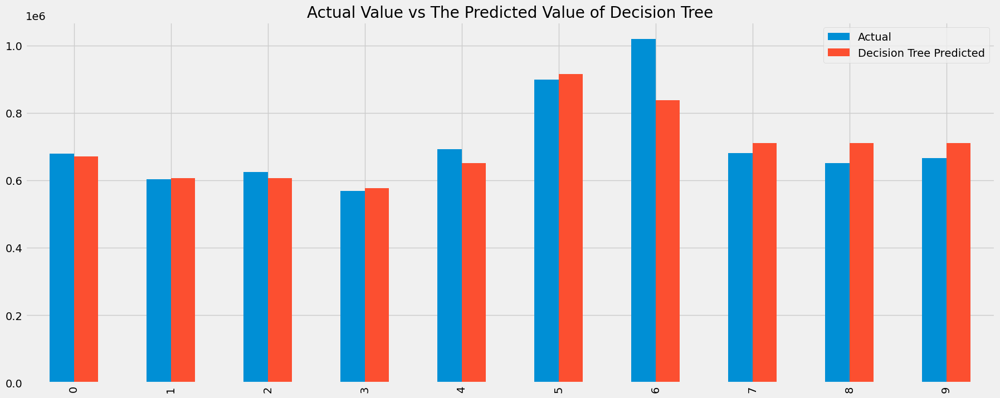

In [261]:
plt.style.use('fivethirtyeight')

##Converting the Y_test to an array

Y_test_2D= Y_test.values

Y_test_1D= Y_test_2D.flatten()

##creating a dataframe for both predicted and actual values 

df=pd.DataFrame({'Actual':Y_test_1D, 'Decision Tree Predicted':result_5})

df1= df.head(10)
df1.plot(kind='bar', figsize=(20,8))
plt.title('Actual Value vs The Predicted Value of Decision Tree');

#### Random Forest

In [262]:
rf= RandomForestRegressor(n_estimators=300, max_depth= 5, random_state= 18, max_features= "sqrt").fit(X_train, Y_train)



In [263]:
result_6= rf.predict(X_test)

In [264]:
MEA_error_6= (MAE(Y_test, result_6)/ Y_test.mean())* 100

RMSLE_error_6= np.sqrt(MSLE(Y_test, result_6))


error_6= pd.DataFrame([["Random Forest", MEA_error_6, RMSLE_error_6]], columns= ["Model", "MAE", "RMSLE"])
               
error_6

,Model,MAE,RMSLE
0,Random Forest,sales 16.424422 dtype: float64,0.270531


#### Visualizing the performance of Random Forest

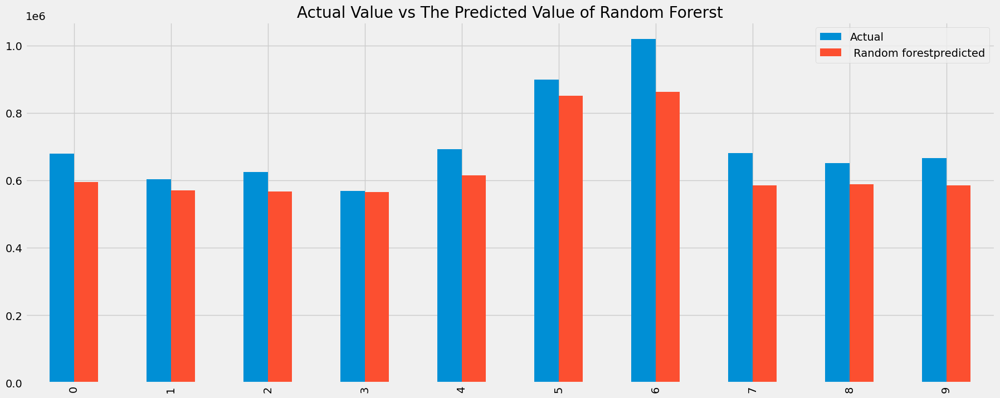

In [265]:
plt.style.use('fivethirtyeight')

df_2=pd.DataFrame({'Actual':Y_test_1D, ' Random forestpredicted':result_6})

df_3=df_2.head(10)

df_3.plot(kind='bar', figsize=(20,8))
plt.title('Actual Value vs The Predicted Value of Random Forerst');

### Results 

In [266]:
result= pd.concat([error_6, error_5, error_4, error_3, error_2, error_1])

In [267]:
result= result.reset_index()

In [268]:
result = result.sort_values(by= "RMSLE")

In [269]:
result

,index,Model,MAE,RMSLE
2,0,SARIMAX,sales 8.082756 dtype: float64,0.107012
5,0,SARIMA,sales 8.766755 dtype: float64,0.109081
1,0,Decision Tree,sales 7.943289 dtype: float64,0.119185
3,0,Facebook Prophet with exo,y 9.859424 dtype: float64,0.234073
0,0,Random Forest,sales 16.424422 dtype: float64,0.270531
4,0,Facebook Prophet,sales 11.037861 dtype: float64,0.277686
